<a href="https://colab.research.google.com/github/palldas/Recidivism-Classifier/blob/main/Recidivism_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Exploratory Data Analysis**

In [ ]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.7 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import StratifiedKFold
from itertools import product
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import umap.umap_ as umap

In [ ]:
import pandas as pd

np.random.seed(42)

df = pd.read_csv("recidivism_full.csv")

df

,ID,Gender,Race,Age_at_Release,Residence_PUMA,Gang_Affiliated,Supervision_Risk_Score_First,Supervision_Level_First,Education_Level,Dependents,...,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Jobs_Per_Year,Employment_Exempt,Recidivism_Within_3years,Recidivism_Arrest_Year1,Recidivism_Arrest_Year2,Recidivism_Arrest_Year3,Training_Sample
0,1,M,BLACK,43-47,16,False,3.0,Standard,At least some college,3 or more,...,0.000000,0.0,0.488562,0.447610,False,False,False,False,False,1
1,2,M,BLACK,33-37,16,False,6.0,Specialized,Less than HS diploma,1,...,0.000000,0.0,0.425234,2.000000,False,True,False,False,True,1
2,3,M,BLACK,48 or older,24,False,7.0,High,At least some college,3 or more,...,0.166667,0.0,0.000000,0.000000,False,True,False,True,False,1
3,4,M,WHITE,38-42,16,False,7.0,High,Less than HS diploma,1,...,0.000000,0.0,1.000000,0.718996,False,False,False,False,False,1
4,5,M,WHITE,33-37,16,False,4.0,Specialized,Less than HS diploma,3 or more,...,0.058824,0.0,0.203562,0.929389,False,True,True,False,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25830,26756,M,BLACK,23-27,9,False,5.0,Standard,At least some college,1,...,0.000000,0.0,0.189507,0.572044,False,True,True,False,False,1
25831,26758,M,WHITE,38-42,25,False,5.0,Standard,At least some college,3 or more,...,0.000000,0.0,0.757098,0.576104,False,True,False,True,False,1
25832,26759,M,BLACK,33-37,15,False,5.0,Standard,At least some college,3 or more,...,NaN,NaN,0.711138,0.894125,False,True,False,True,False,1
25833,26760,F,WHITE,33-37,15,NaN,5.0,Standard,At least some college,3 or more,...,0.000000,0.0,0.000000,0.000000,True,False,False,False,False,1


In [ ]:
df["Gender"].value_counts()

,count
Gender,
M,22668
F,3167


### **Cleaning the Data**

In [ ]:
# Check for missing values

pd.DataFrame(df.isna().sum(), columns = ["Number of Missing Values"])

,Number of Missing Values
ID,0
Gender,0
Race,0
Age_at_Release,0
Residence_PUMA,0
Gang_Affiliated,3167
Supervision_Risk_Score_First,475
Supervision_Level_First,1720
Education_Level,0
Dependents,0


In [ ]:
# Drop unnecessary or unknown columns

df = df.drop(["ID",
              "Gender",
              "Supervision_Risk_Score_First",
              "Supervision_Level_First",
              'Avg_Days_per_DrugTest',
              'Recidivism_Arrest_Year1',
              'Recidivism_Arrest_Year2',
              'Recidivism_Arrest_Year3',
              'Training_Sample',
              'Residence_PUMA',
              'Program_Attendances',
              'Program_UnexcusedAbsences'
              ], axis = 1)

In [ ]:
# Drop all the rows with missing values in these columns

df = df.dropna(subset=['Gang_Affiliated',
                       'Prison_Offense',
                       'DrugTests_THC_Positive',
                       'DrugTests_THC_Positive',
                       'DrugTests_Meth_Positive',
                       'DrugTests_Other_Positive',
                       'Percent_Days_Employed',
                       'Jobs_Per_Year'])

In [ ]:
# Reset the index after dropping the rows

df = df.reset_index().drop("index", axis = 1)

In [ ]:
# Determine if our dataset is imbalanced

df["Recidivism_Within_3years"].value_counts()

,count
Recidivism_Within_3years,
True,9001
False,6176


([<matplotlib.patches.Wedge at 0x795ca8a63940>,
 [Text(-0.31705866496783364, 1.0533156236232402, 'True'),
  Text(0.3170587635863585, -1.0533155939380607, 'False')],
 [Text(-0.1729410899824547, 0.5745357947035854, '59.3%'),
  Text(0.17294114377437733, -0.5745357785116695, '40.7%')])

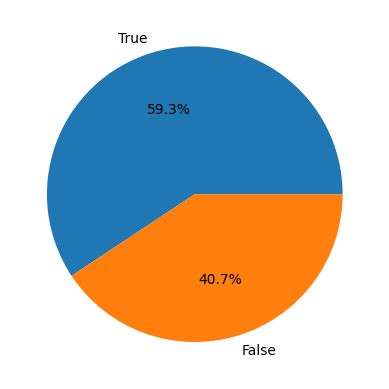

In [ ]:
import matplotlib.pyplot as plt

plt.pie(df["Recidivism_Within_3years"].value_counts(), labels = ["True", "False"], autopct = '%1.1f%%')

Based on the value counts above, it is clear that our dataset is imbalanced. Thus, we will be using f1 score and models that can handle imbalanced datasets such as RandomForestClassifier and DBSCAN.

In [ ]:
# Determine whether the "Race" column is balanced or imbalanced

df["Race"].value_counts()

,count
Race,
BLACK,8987
WHITE,6190


([<matplotlib.patches.Wedge at 0x795ca8718c40>,
 [Text(-0.3140048972899743, 1.0542300149767663, 'Race 1'),
  Text(0.3140049959941103, -1.0542299855775015, 'Race 2')],
 [Text(-0.17127539852180418, 0.5750345536236906, '59.2%'),
  Text(0.17127545236042377, -0.575034537587728, '40.8%')])

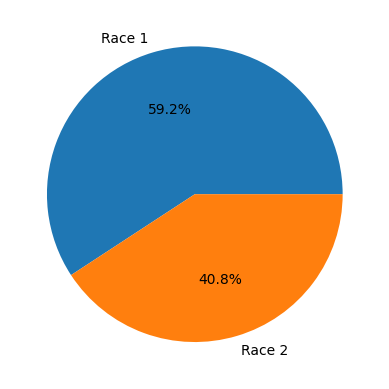

In [ ]:
plt.pie(df["Race"].value_counts(), labels = ["Race 1", "Race 2"], autopct = '%1.1f%%')

Although the attributes do not have the same exact value count, we are not considering this column to be imbalanced.

In [ ]:
# Extract the target column, "Recidivism_Within_3years", the "Race" column, and the features

target = df["Recidivism_Within_3years"]

race_column = df["Race"]

features = df.drop(["Recidivism_Within_3years"], axis = 1)

In [ ]:
# LabelEncode the categorical columns to prepare for feature-to-feature correlation and mutual information

from sklearn.preprocessing import LabelEncoder

features_copy = features.copy()

categorical_cols = features.select_dtypes(include = ['object', 'bool']).columns.tolist()

label_encoder = LabelEncoder()

for col in categorical_cols:

  features_copy[col] = label_encoder.fit_transform(features_copy[col])

features_copy

,Race,Age_at_Release,Gang_Affiliated,Education_Level,Dependents,Prison_Offense,Prison_Years,Prior_Arrest_Episodes_Felony,Prior_Arrest_Episodes_Misd,Prior_Arrest_Episodes_Violent,...,Violations_MoveWithoutPermission,Delinquency_Reports,Residence_Changes,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Jobs_Per_Year,Employment_Exempt
0,0,5,0,0,3,0,3,7,6,1,...,0,0,2,0.000000,0.0,0.000000,0.0,0.488562,0.447610,0
1,0,3,0,2,1,3,3,8,6,3,...,0,4,2,0.000000,0.0,0.000000,0.0,0.425234,2.000000,0
2,0,6,0,0,3,0,0,7,6,3,...,1,4,0,0.333333,0.0,0.166667,0.0,0.000000,0.000000,0
3,1,4,0,2,1,2,0,9,6,0,...,0,0,3,0.000000,0.0,0.000000,0.0,1.000000,0.718996,0
4,1,3,0,2,3,3,0,5,4,3,...,0,0,0,0.000000,0.0,0.058824,0.0,0.203562,0.929389,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15172,1,2,0,1,3,0,2,3,1,0,...,0,0,1,0.000000,0.0,0.000000,0.0,0.434926,0.601730,0
15173,1,2,0,0,2,0,2,3,1,0,...,0,0,0,0.000000,0.0,0.000000,0.0,0.893939,1.000000,0
15174,0,1,0,1,3,0,2,1,0,0,...,0,0,0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0
15175,1,6,0,0,3,2,2,4,4,0,...,0,0,1,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0


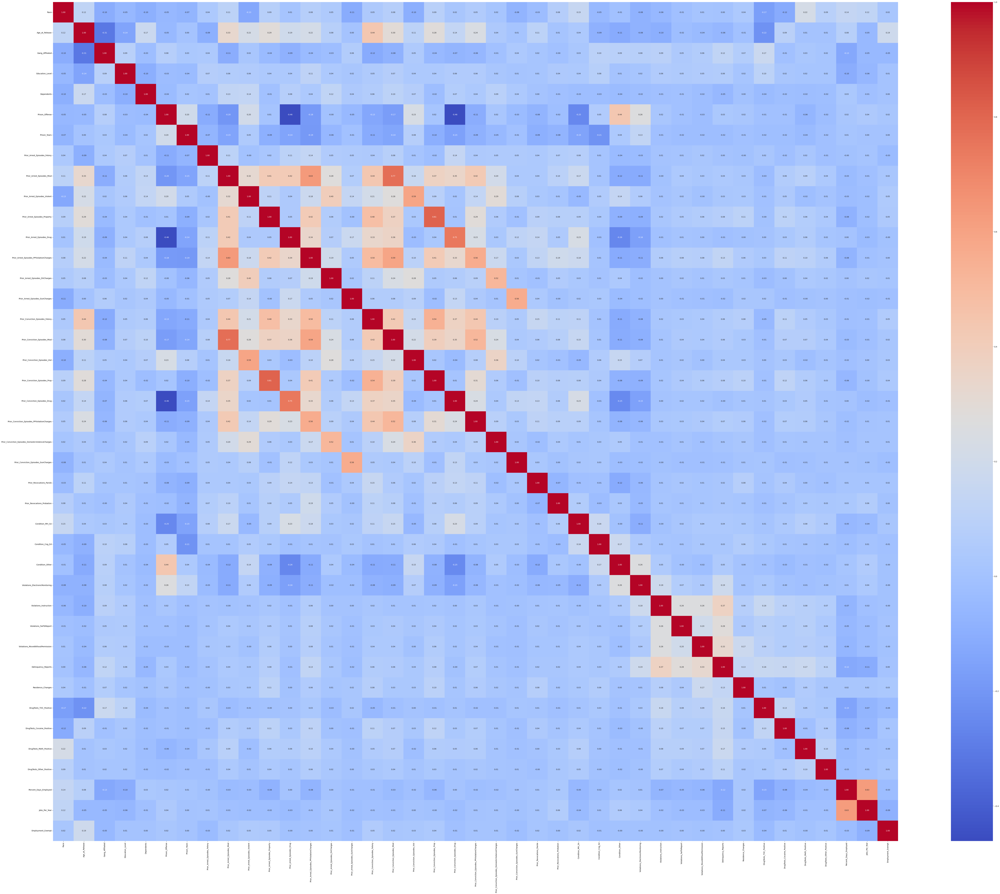

In [ ]:
# Find the feature-to-feature correlation

import seaborn as sns

import matplotlib.pyplot as plt

plt.figure(figsize = (100,80))

sns.heatmap(features_copy.corr(), annot = True, cmap = "coolwarm", fmt = ".2f")

plt.show()

After reviewing the heatmap, we found that "Jobs_Per_Year" and "Percent_Days_Employed", "Prior_Conviction_Episodes_Misd" and "Prior_Arrest_Episodes_Misd", "Prior_Arrest_Episodes_Property" and "Prior_Conviction_Episodes_Property", and "Prior_Arrest_Episodes_Drugs" and "Prior_Conviction_Episodes_Drugs" had a high correlation.

In [ ]:
features = features.drop(["Race"], axis = 1)

In [ ]:
# Calculate the mutual information between feature and target variables

from sklearn.feature_selection import mutual_info_regression

mutual_info = pd.DataFrame(columns = ["Pairs", "Mutual Information"])

for col in features_copy.columns:

  mutual_info.loc[len(mutual_info)] = {"Pairs": col + ", Recidivism", "Mutual Information": mutual_info_regression(features_copy[[col]], target)}

mutual_info

,Pairs,Mutual Information
0,"Race, Recidivism",[0.0020573101858571974]
1,"Age_at_Release, Recidivism",[0.011992778802075499]
2,"Gang_Affiliated, Recidivism",[0.008894584354811386]
3,"Education_Level, Recidivism",[0.0054912904416308805]
4,"Dependents, Recidivism",[0.0006914541910640892]
5,"Prison_Offense, Recidivism",[0.010799915147540418]
6,"Prison_Years, Recidivism",[0.013396298132217765]
7,"Prior_Arrest_Episodes_Felony, Recidivism",[0.023254294631152028]
8,"Prior_Arrest_Episodes_Misd, Recidivism",[0.019865778990157956]
9,"Prior_Arrest_Episodes_Violent, Recidivism",[0.00382365971737908]


In [ ]:
# Dropped redundant columns found in feature-to-feature correlation

features = features.drop(["Jobs_Per_Year", "Prior_Arrest_Episodes_Misd", "Prior_Arrest_Episodes_Property", "Prior_Arrest_Episodes_Drug"], axis = 1)

### **Split the Data**

In [ ]:
# Split the dataset

from sklearn.model_selection import train_test_split

X_train, X_generalization, y_train, y_generalization = train_test_split(features, target, test_size = 0.2, random_state = 42)

In [ ]:
# Concatenate the features of the generalized set, race_column, and the target of the generalized set
# This data set will be used later when determining if the classifier is bias

generalization = pd.concat([X_generalization, race_column, y_generalization], axis = 1)

generalization = generalization.dropna()
# drop duplicate columns
generalization = generalization.loc[:,~generalization.columns.duplicated()]
generalization

,Age_at_Release,Gang_Affiliated,Education_Level,Dependents,Prison_Offense,Prison_Years,Prior_Arrest_Episodes_Felony,Prior_Arrest_Episodes_Violent,Prior_Arrest_Episodes_PPViolationCharges,Prior_Arrest_Episodes_DVCharges,...,Delinquency_Reports,Residence_Changes,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Employment_Exempt,Race,Recidivism_Within_3years
14427,18-22,False,High School Diploma,1,Property,Less than 1 year,2,0,0,False,...,4 or more,0,0.176471,0.0,0.0,0.0,0.436364,False,WHITE,True
8473,28-32,False,High School Diploma,3 or more,Drug,Less than 1 year,3,1,1,False,...,0,1,0.000000,0.0,0.0,0.0,0.787986,False,BLACK,True
14029,18-22,False,Less than HS diploma,0,Property,1-2 years,3,0,1,False,...,0,1,0.000000,0.0,0.0,0.0,0.129717,False,BLACK,True
3344,48 or older,False,High School Diploma,3 or more,Other,Less than 1 year,5,3 or more,0,True,...,0,1,0.000000,0.0,0.0,0.0,1.000000,False,BLACK,False
7061,23-27,False,High School Diploma,1,Drug,1-2 years,10 or more,0,5 or more,False,...,3,3 or more,0.000000,0.0,0.0,0.0,0.754032,False,BLACK,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9643,28-32,False,High School Diploma,3 or more,Drug,1-2 years,6,0,2,False,...,0,1,0.000000,0.0,0.0,0.0,1.000000,False,BLACK,False
5890,28-32,False,High School Diploma,2,Other,Less than 1 year,5,0,3,False,...,0,1,0.166667,0.0,0.0,0.0,0.884701,False,BLACK,True
4064,28-32,False,Less than HS diploma,2,Property,Greater than 2 to 3 years,5,0,0,False,...,4 or more,3 or more,0.000000,0.0,0.0,0.0,0.000000,False,BLACK,True
6388,23-27,False,Less than HS diploma,2,Property,More than 3 years,2,1,0,True,...,0,1,0.000000,0.0,0.0,0.0,0.100298,False,WHITE,True


In [ ]:
# Reset the training set index

X_train = X_train.reset_index()
X_train = X_train.drop("index", axis = 1)

In [ ]:
# Reset the generalized set index

X_generalization = X_generalization.reset_index()
X_generalization = X_generalization.drop("index", axis = 1)

### **Standardize the Train and Test Set**

In [ ]:
from sklearn.preprocessing import StandardScaler

X_train_numerical = X_train.select_dtypes(include = ["float64"])

scaler = StandardScaler()

columns = X_train_numerical.columns

X_train_numerical = scaler.fit_transform(X_train_numerical)

X_train_numerical = pd.DataFrame(X_train_numerical, columns = columns)

X_train = pd.concat([X_train_numerical, X_train], axis = 1)

In [ ]:
scaler = StandardScaler()

X_generalization_numerical = X_generalization.select_dtypes(include = ["float64"])

columns = X_generalization_numerical.columns

X_generalization_numerical = scaler.fit_transform(X_generalization_numerical)

X_generalization_numerical = pd.DataFrame(X_generalization, columns = columns)

X_generalization = pd.concat([X_generalization_numerical, X_generalization], axis = 1)

X_generalization

,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Age_at_Release,Gang_Affiliated,Education_Level,Dependents,Prison_Offense,...,Violations_FailToReport,Violations_MoveWithoutPermission,Delinquency_Reports,Residence_Changes,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Employment_Exempt
0,0.176471,0.0,0.0,0.0,0.436364,18-22,False,High School Diploma,1,Property,...,False,False,4 or more,0,0.176471,0.0,0.0,0.0,0.436364,False
1,0.000000,0.0,0.0,0.0,0.787986,28-32,False,High School Diploma,3 or more,Drug,...,False,False,0,1,0.000000,0.0,0.0,0.0,0.787986,False
2,0.000000,0.0,0.0,0.0,0.129717,18-22,False,Less than HS diploma,0,Property,...,False,False,0,1,0.000000,0.0,0.0,0.0,0.129717,False
3,0.000000,0.0,0.0,0.0,1.000000,48 or older,False,High School Diploma,3 or more,Other,...,False,False,0,1,0.000000,0.0,0.0,0.0,1.000000,False
4,0.000000,0.0,0.0,0.0,0.754032,23-27,False,High School Diploma,1,Drug,...,False,False,3,3 or more,0.000000,0.0,0.0,0.0,0.754032,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3031,0.000000,0.0,0.0,0.0,1.000000,28-32,False,High School Diploma,3 or more,Drug,...,False,False,0,1,0.000000,0.0,0.0,0.0,1.000000,False
3032,0.166667,0.0,0.0,0.0,0.884701,28-32,False,High School Diploma,2,Other,...,False,False,0,1,0.166667,0.0,0.0,0.0,0.884701,False
3033,0.000000,0.0,0.0,0.0,0.000000,28-32,False,Less than HS diploma,2,Property,...,True,True,4 or more,3 or more,0.000000,0.0,0.0,0.0,0.000000,False
3034,0.000000,0.0,0.0,0.0,0.100298,23-27,False,Less than HS diploma,2,Property,...,False,False,0,1,0.000000,0.0,0.0,0.0,0.100298,False


### **Encode the Training and Test Set**

In [ ]:
from sklearn.preprocessing import OneHotEncoder

cat_cols = X_train.select_dtypes(include = ['object', 'bool']).columns.tolist()

One_Hot_Encoder = OneHotEncoder(sparse_output = False)

One_Hot_Encoded_Cols = One_Hot_Encoder.fit_transform(X_train[cat_cols])

DF_One_Hot_Encoded = pd.DataFrame(One_Hot_Encoded_Cols, columns = One_Hot_Encoder.get_feature_names_out())

In [ ]:
X_train = pd.concat([X_train, DF_One_Hot_Encoded], axis = 1)

X_train = X_train.drop(cat_cols, axis = 1)

X_train

,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,...,Delinquency_Reports_1,Delinquency_Reports_2,Delinquency_Reports_3,Delinquency_Reports_4 or more,Residence_Changes_0,Residence_Changes_1,Residence_Changes_2,Residence_Changes_3 or more,Employment_Exempt_False,Employment_Exempt_True
0,-0.484567,-0.230263,-0.21289,-0.174543,-0.794400,0.0,0.0,0.0,0.0000,0.192308,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,-0.484567,-0.230263,-0.21289,-0.174543,-1.255634,0.0,0.0,0.0,0.0000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,-0.484567,-0.230263,-0.21289,-0.174543,-1.255634,0.0,0.0,0.0,0.0000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,2.246125,3.000841,-0.21289,-0.174543,-1.255634,0.4,0.2,0.0,0.0000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,-0.484567,-0.230263,-0.21289,-0.174543,1.142783,0.0,0.0,0.0,0.0000,1.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,-0.484567,-0.230263,-0.21289,-0.174543,1.142783,0.0,0.0,0.0,0.0000,1.000000,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
12137,-0.484567,-0.230263,-0.21289,-0.174543,1.142783,0.0,0.0,0.0,0.0000,1.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
12138,-0.484567,-0.230263,-0.21289,-0.174543,-1.255634,0.0,0.0,0.0,0.0000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
12139,-0.484567,-0.230263,-0.21289,1.278952,1.132562,0.0,0.0,0.0,0.0625,0.995739,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
cat_cols = X_generalization.select_dtypes(include = ["object", "bool"]).columns.tolist()

One_Hot_Encoder = OneHotEncoder(sparse_output = False)

One_Hot_Encoded_Columns = One_Hot_Encoder.fit_transform(X_generalization[cat_cols])

DF_One_Hot_Encoded = pd.DataFrame(One_Hot_Encoded_Columns, columns = One_Hot_Encoder.get_feature_names_out())

In [ ]:
X_generalization = pd.concat([X_generalization, DF_One_Hot_Encoded], axis = 1)

X_generalization = X_generalization.drop(cat_cols, axis = 1)

X_generalization

,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,DrugTests_THC_Positive,DrugTests_Cocaine_Positive,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,...,Delinquency_Reports_1,Delinquency_Reports_2,Delinquency_Reports_3,Delinquency_Reports_4 or more,Residence_Changes_0,Residence_Changes_1,Residence_Changes_2,Residence_Changes_3 or more,Employment_Exempt_False,Employment_Exempt_True
0,0.176471,0.0,0.0,0.0,0.436364,0.176471,0.0,0.0,0.0,0.436364,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.000000,0.0,0.0,0.0,0.787986,0.000000,0.0,0.0,0.0,0.787986,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.000000,0.0,0.0,0.0,0.129717,0.000000,0.0,0.0,0.0,0.129717,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.000000,0.0,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.000000,0.0,0.0,0.0,0.754032,0.000000,0.0,0.0,0.0,0.754032,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3031,0.000000,0.0,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3032,0.166667,0.0,0.0,0.0,0.884701,0.166667,0.0,0.0,0.0,0.884701,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3033,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
3034,0.000000,0.0,0.0,0.0,0.100298,0.000000,0.0,0.0,0.0,0.100298,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


### **Prepare the Data for Determing Bias**

In [ ]:
# Extract the "Race" and "Recidivism_Within_3years" columns from the original generalized data set

test_race_column = generalization[["Recidivism_Within_3years", "Race"]]

test_race_column = test_race_column.reset_index()

test_race_column = test_race_column.drop("index", axis = 1)

test_race_column

,Recidivism_Within_3years,Race
0,True,WHITE
1,True,BLACK
2,True,BLACK
3,False,BLACK
4,True,BLACK
...,...,...
3031,False,BLACK
3032,True,BLACK
3033,True,BLACK
3034,True,WHITE


In [ ]:
# Concatenate the target column and "Race" column to the generalized dataset after it has been standardized and encoded.
# This was done now to prevent these columns from being encoded and standardized

generalized = pd.concat([X_generalization, test_race_column], axis = 1)

In [ ]:
# Split the generalized dataset by race.
# These sets will be used to compare the accuracies across different races and determine if our model is biased

generalized_race_1 = generalized.loc[generalized["Race"] == "BLACK"]

generalized_race_2 = generalized.loc[generalized["Race"] == "WHITE"]

## **Cluster Visualization**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

In [ ]:
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, random_state=42)

In [ ]:
X_pca = pca.fit_transform(X_train)
X_tsne = tsne.fit_transform(X_train)

In [ ]:
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(X_train)

PCA Explained Variance:
First component: 7.572%
Second component: 5.998%
Total (2 components): 13.570%

Cluster Statistics:

Cluster 0:
Size: 6412
Recidivism rate: 44.34%

Cluster 1:
Size: 5729
Recidivism rate: 75.79%


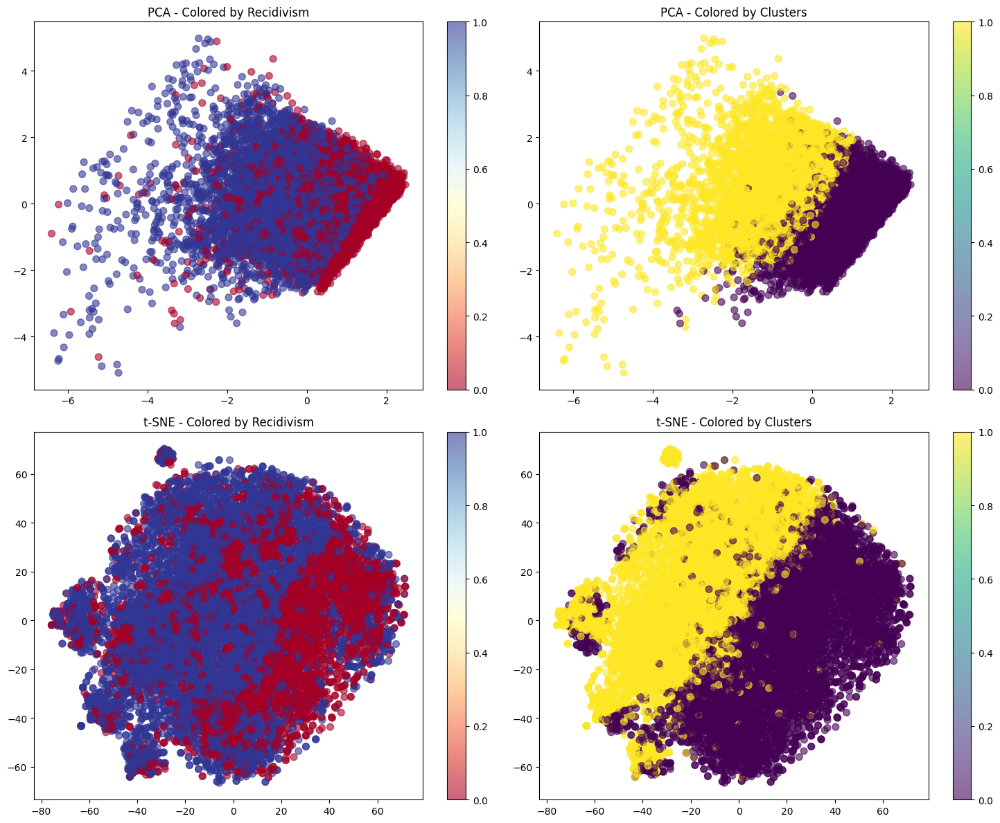

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

scatter_params = dict(alpha=0.6, s=50)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by Clusters')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by Clusters')
plt.colorbar(scatter4, ax=axes[1, 1])

plt.tight_layout()

print("PCA Explained Variance:")
print(f"First component: {pca.explained_variance_ratio_[0]:.3%}")
print(f"Second component: {pca.explained_variance_ratio_[1]:.3%}")
print(f"Total (2 components): {sum(pca.explained_variance_ratio_[:2]):.3%}")

print("\nCluster Statistics:")
for i in range(n_clusters):
    mask = clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_train[mask]):.2%}")

## **Random Forest Classifier**

In [ ]:
# remove if needed, testing
# from imblearn.over_sampling import SMOTE

# smote = SMOTE(random_state=42)
# X_train, y_train= smote.fit_resample(X_train, y_train)

In [ ]:
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score

hyperparameters = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9],
    'criteria_values': ['entropy']
}


k_outer = 3
k_inner = 5
random_state = 42

predictions = {}
accuracies = []
precisions = []
recalls = []
models = []
FP = []
FN = []
TP = []
TN = []

k_fold_outer = StratifiedKFold(n_splits=k_outer, shuffle=True, random_state=random_state)
k_fold_inner = StratifiedKFold(n_splits=k_inner, shuffle=True, random_state=random_state)

outer_count = 0
overall_count = 0

for outer_train_index, outer_test_index in k_fold_outer.split(X_train, y_train):
    # Split data for outer fold using iloc for DataFrame indexing
    outer_training_set = X_train.iloc[outer_train_index]
    outer_test_set = X_train.iloc[outer_test_index]
    outer_training_labels = y_train.iloc[outer_train_index]
    outer_test_labels = y_train.iloc[outer_test_index]

    best_inner_accuracy = 0
    best_params = {}
    inner_count = 0

    for inner_train_index, inner_test_index in k_fold_inner.split(outer_training_set, outer_training_labels):
        # Split data for inner fold using iloc for DataFrame indexing
        inner_training_set = outer_training_set.iloc[inner_train_index]
        inner_test_set = outer_training_set.iloc[inner_test_index]
        inner_training_labels = outer_training_labels.iloc[inner_train_index]
        inner_test_labels = outer_training_labels.iloc[inner_test_index]

        for max_depth, min_samples_split, criterion in product(
            hyperparameters['max_depth'],
            hyperparameters['min_samples_split'],
            hyperparameters['criteria_values']
        ):

            random_forest_classifier = RandomForestClassifier(
                max_depth=max_depth,
                min_samples_split=min_samples_split,
                criterion=criterion,
                random_state=random_state
            )

            random_forest_classifier.fit(inner_training_set, inner_training_labels)

            y_pred = random_forest_classifier.predict(inner_test_set)

            accuracy = f1_score(inner_test_labels, y_pred)

            inner_confusion_matrix = confusion_matrix(inner_test_labels, y_pred)

            FP.append(inner_confusion_matrix[0][1])

            FN.append(inner_confusion_matrix[1][0])

            TP.append(inner_confusion_matrix[1][1])

            TN.append(inner_confusion_matrix[0][0])

            predictions[overall_count] = {
                'outer_fold': outer_count,
                'inner_fold': inner_count,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'criterion': criterion,
                'accuracy': accuracy
            }
            overall_count += 1

            if accuracy > best_inner_accuracy:
                best_inner_accuracy = accuracy
                best_params = {
                    'max_depth': max_depth,
                    'min_samples_split': min_samples_split,
                    'criterion': criterion
                }

        inner_count += 1

    best_model = RandomForestClassifier(**best_params, random_state=random_state)
    best_model.fit(outer_training_set, outer_training_labels)
    models.append(best_model)

    y_pred_outer = best_model.predict(outer_test_set)
    outer_test_accuracy = f1_score(outer_test_labels, y_pred_outer)
    outer_test_precision = precision_score(outer_test_labels, y_pred_outer)
    outer_test_recall = recall_score(outer_test_labels, y_pred_outer)

    accuracies.append(outer_test_accuracy)

    precisions.append(outer_test_precision)

    recalls.append(outer_test_recall)

    print(f"Outer Fold {outer_count + 1}, Best Params: {best_params}, "
          f"Outer Test F1 Score: {outer_test_accuracy:.4f}")

    outer_count += 1

outer_confusion_matrix =[[np.mean(TN), np.mean(FP)], [np.mean(FN), np.mean(TP)]]

print(f"\nOuter Loop F1 Scores: {accuracies}")
print(f"\nOuter Loop Precisions: {precisions}")
print(f"\nOuter Loop Recall Scores: {recalls}")
print(f"\nMean Outer Test F1 Score: {np.mean(accuracies):.4f}")
print(f"\nMean Outer Test Precision: {np.mean(precisions): .4f}")
print(f"Mean Outer Test Recall Score: {np.mean(recalls): .4f}")


Outer Fold 1, Best Params: {'max_depth': 10, 'min_samples_split': 4, 'criterion': 'entropy'}, Outer Test F1 Score: 0.7758
Outer Fold 2, Best Params: {'max_depth': 3, 'min_samples_split': 2, 'criterion': 'entropy'}, Outer Test F1 Score: 0.7658
Outer Fold 3, Best Params: {'max_depth': 4, 'min_samples_split': 2, 'criterion': 'entropy'}, Outer Test F1 Score: 0.7686

Outer Loop F1 Scores: [0.775842044134727, 0.7658149779735682, 0.7686445291235711]

Outer Loop Precisions: [0.7232046192710213, 0.6625, 0.6797175866495507]

Outer Loop Recall Scores: [0.8367432150313152, 0.9073068893528183, 0.8843423799582464]

Mean Outer Test F1 Score: 0.7701

Mean Outer Test Precision:  0.6885
Mean Outer Test Recall Score:  0.8761


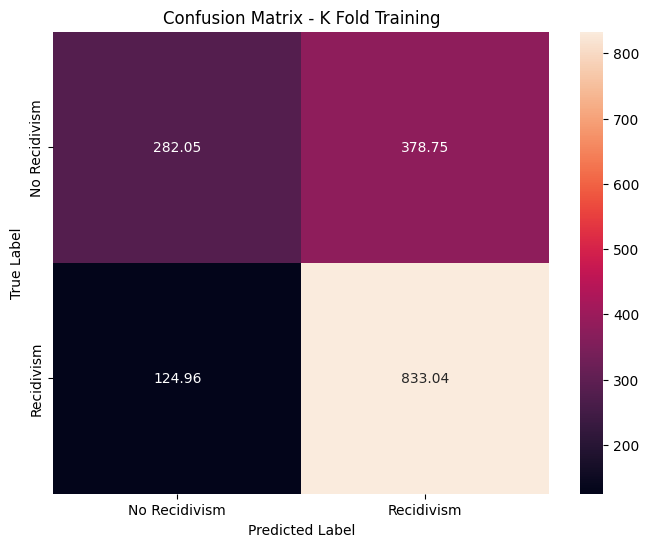

In [ ]:
plt.figure(figsize = (8, 6))
sns.heatmap(outer_confusion_matrix,
            annot = True,
            fmt = '.2f',
            xticklabels = ["No Recidivism", "Recidivism"],
            yticklabels = ["No Recidivism", "Recidivism"])

plt.xlabel("Predicted Label")

plt.ylabel("True Label")

plt.title("Confusion Matrix - K Fold Training")

plt.show()

In [ ]:
# Calculate the predictions for each generalized set

best_model = RandomForestClassifier(max_depth = 4, min_samples_split = 2, criterion = "entropy", random_state = 42)

best_model.fit(X_train, y_train)

predictions_race_1 = best_model.predict(generalized_race_1.drop(["Race", "Recidivism_Within_3years"], axis = 1))

predictions_race_2 = best_model.predict(generalized_race_2.drop(["Race", "Recidivism_Within_3years"], axis = 1))

In [ ]:
predictions_clean = np.array(predictions_race_1, dtype=bool)

actual_clean = np.array(generalized_race_1["Recidivism_Within_3years"], dtype=bool)

In [ ]:
# Calculate the F1 score for the first generalized set

f1 = f1_score(actual_clean, predictions_clean)

f1

0.7769443347808922

In [ ]:
from sklearn.metrics import precision_score

precision_score(actual_clean, predictions_clean)

0.6895585143658024

In [ ]:
recall_score(actual_clean, predictions_clean)

0.8896925858951176

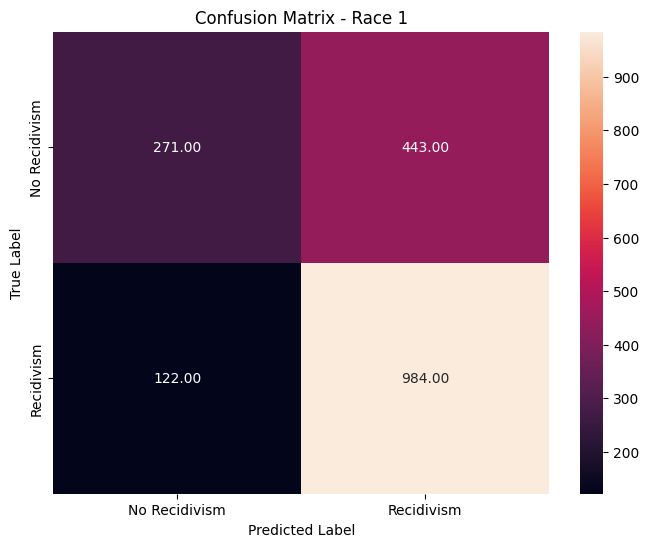

In [ ]:
from sklearn.metrics import confusion_matrix

# sns.heatmap(confusion_matrix(actual_clean, predictions_clean), annot = True, fmt = '.2f')
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean, predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Race 1')
plt.show()

In [ ]:
predictions_clean = np.array(predictions_race_2, dtype = bool)

actual_clean = np.array(generalized_race_2["Recidivism_Within_3years"], dtype = bool)

In [ ]:
# Calculate the F1 score for the second generalized set

f1_score(actual_clean, predictions_clean)

0.7916137229987293

In [ ]:
precision_score(actual_clean, predictions_clean)

0.7210648148148148

In [ ]:
recall_score(actual_clean, predictions_clean)

0.8774647887323944

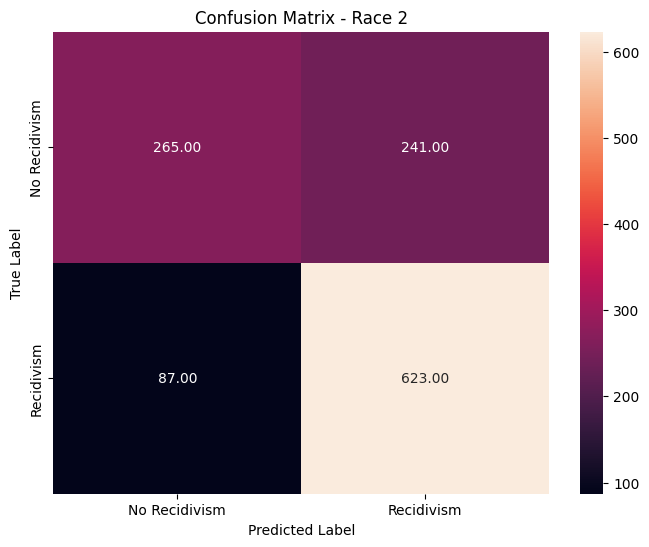

In [ ]:
# sns.heatmap(confusion_matrix(actual_clean, predictions_clean), annot = True, fmt = '.2f')
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean, predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Race 2')
plt.show()

## **DBSCAN**

In [ ]:
# Same code as above but modified to used DBSCAN
from sklearn.metrics import f1_score
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score

hyperparameters = {
    'eps': [0.01, 0.02, 0.03, 0.04, 0.05],
    'min_samples': [5, 10, 15, 20, 25],
    'metric': ['euclidean', 'manhattan', 'chebyshev']
}

k_outer = 3
k_inner = 5
random_state = 42

predictions = {}
accuracies = []
models = []

k_fold_outer = StratifiedKFold(n_splits=k_outer, shuffle=True, random_state=random_state)
k_fold_inner = StratifiedKFold(n_splits=k_inner, shuffle=True, random_state=random_state)

outer_count = 0
overall_count = 0

for outer_train_index, outer_test_index in k_fold_outer.split(X_train, y_train):
    # Split data for outer fold using iloc for DataFrame indexing
    outer_training_set = X_train.iloc[outer_train_index]
    outer_test_set = X_train.iloc[outer_test_index]
    outer_training_labels = y_train.iloc[outer_train_index]
    outer_test_labels = y_train.iloc[outer_test_index]

    best_inner_accuracy = 0
    best_params = {}
    inner_count = 0

    for inner_train_index, inner_test_index in k_fold_inner.split(outer_training_set, outer_training_labels):
        # Split data for inner fold using iloc for DataFrame indexing
        inner_training_set = outer_training_set.iloc[inner_train_index]
        inner_test_set = outer_training_set.iloc[inner_test_index]
        inner_training_labels = outer_training_labels.iloc[inner_train_index]
        inner_test_labels = outer_training_labels.iloc[inner_test_index]

        for eps, min_samples, metric in product(
            hyperparameters['eps'],
            hyperparameters['min_samples'],
            hyperparameters['metric']
        ):

            dbscan = DBSCAN(
                eps=eps,
                min_samples=min_samples,
                metric=metric
            )

            dbscan.fit(inner_training_set)
            # accuracy = f1_score(inner_test_set, inner_test_labels)

            y_pred = dbscan.fit_predict(inner_test_set)
            # modify predicts to match what f_1 expects.
            y_pred = [True if x == -1 else False for x in y_pred]

            accuracy = f1_score(inner_test_labels, y_pred)

            predictions[overall_count] = {
                'outer_fold': outer_count,
                'inner_fold': inner_count,
                'eps': eps,
                'min_samples': min_samples,
                'metric': metric,
                'accuracy': accuracy
            }
            overall_count += 1

            if accuracy > best_inner_accuracy:
                print("Found better accuracy", accuracy)
                best_inner_accuracy = accuracy
                best_params = {
                    'eps': eps,
                    'min_samples': min_samples,
                    'metric': metric
                }

        inner_count += 1

    best_model = DBSCAN(**best_params)
    best_model.fit(outer_training_set)
    models.append(best_model)

    y_pred_outer = best_model.fit_predict(outer_test_set)
    y_pred_outer = [1 if x == -1 else 0 for x in y_pred_outer]
    outer_test_accuracy = f1_score(outer_test_labels, y_pred_outer)
    # outer_test_accuracy = score(outer_test_set, outer_test_labels)
    accuracies.append(outer_test_accuracy)

    print(f"Outer Fold {outer_count + 1}, Best Params: {best_params}, "
          f"Outer Test Accuracy: {outer_test_accuracy}")

    outer_count += 1

print(f"\nOuter Loop Accuracies: {accuracies}")
print(f"Mean Outer Test Accuracy: {np.mean(accuracies)}")



Found better accuracy 0.743500194024059
Found better accuracy 0.7437888198757764
Outer Fold 1, Best Params: {'eps': 0.01, 'min_samples': 5, 'metric': 'euclidean'}, Outer Test Accuracy: 0.7435579012728967
Found better accuracy 0.743500194024059
Found better accuracy 0.7437888198757764
Outer Fold 2, Best Params: {'eps': 0.01, 'min_samples': 5, 'metric': 'euclidean'}, Outer Test Accuracy: 0.7435579012728967
Found better accuracy 0.743500194024059
Found better accuracy 0.7437888198757764
Outer Fold 3, Best Params: {'eps': 0.01, 'min_samples': 5, 'metric': 'euclidean'}, Outer Test Accuracy: 0.7435579012728967

Outer Loop Accuracies: [0.7435579012728967, 0.7435579012728967, 0.7435579012728967]
Mean Outer Test Accuracy: 0.7435579012728967


In [ ]:
best_model = DBSCAN(eps = 0.01, min_samples = 5)

best_model.fit(X_train, y_train)

DBSCAN(eps=0.01)

In [ ]:
predictions_race_1 = best_model.fit_predict(generalized_race_1.drop(["Race", "Recidivism_Within_3years"], axis = 1))

predictions_race_2 = best_model.fit_predict(generalized_race_2.drop(["Race", "Recidivism_Within_3years"], axis = 1))

In [ ]:
predictions_clean = np.array(predictions_race_1, dtype = bool)

actual_clean = np.array(generalized_race_1["Recidivism_Within_3years"], dtype = bool)

In [ ]:
pd.DataFrame(predictions_clean).value_counts()

,count
0,
True,1820


In [ ]:
X_pca = pca.fit_transform(X_generalization)
X_tsne = tsne.fit_transform(X_generalization)

In [ ]:
clusters = best_model.fit_predict(X_generalization)

n_clusters = 2

PCA Explained Variance:
First component: 8.058%
Second component: 5.843%
Total (2 components): 13.901%

Cluster Statistics:

Cluster 0:
Size: 0
Recidivism rate: nan%

Cluster 1:
Size: 0
Recidivism rate: nan%


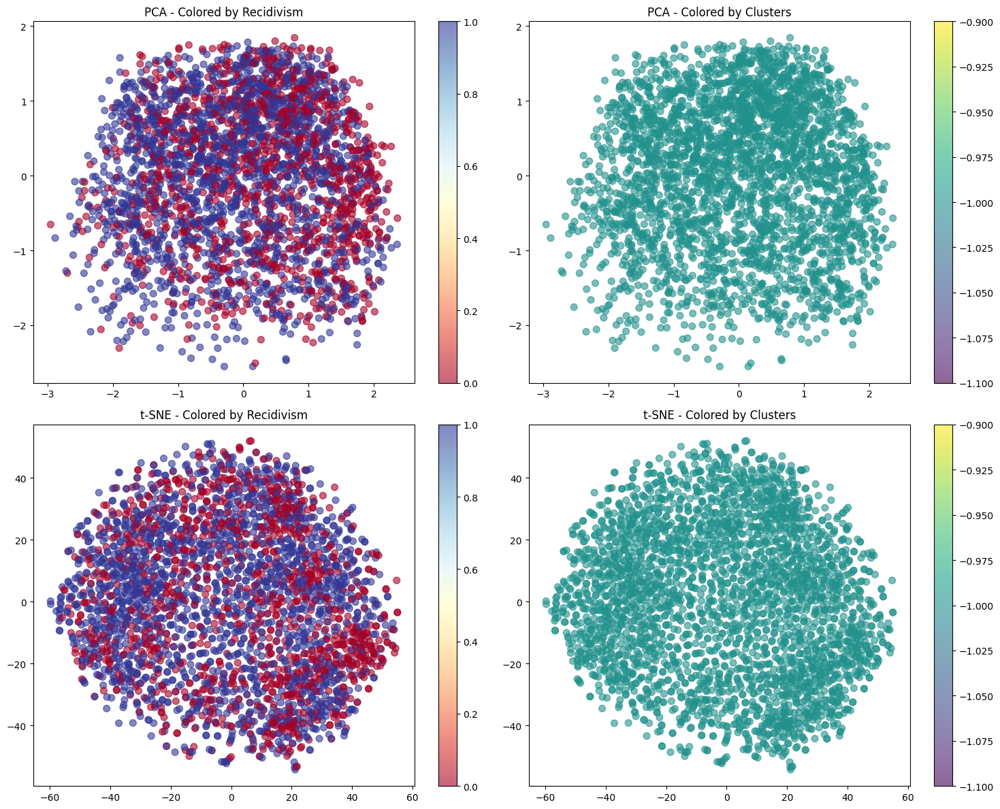

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

scatter_params = dict(alpha=0.6, s=50)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by Clusters')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by Clusters')
plt.colorbar(scatter4, ax=axes[1, 1])

plt.tight_layout()

print("PCA Explained Variance:")
print(f"First component: {pca.explained_variance_ratio_[0]:.3%}")
print(f"Second component: {pca.explained_variance_ratio_[1]:.3%}")
print(f"Total (2 components): {sum(pca.explained_variance_ratio_[:2]):.3%}")

print("\nCluster Statistics:")
for i in range(n_clusters):
    mask = clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_generalization[mask]):.2%}")

In [ ]:
silhouette_score(pd.DataFrame(generalized_race_1["Recidivism_Within_3years"]), predictions_clean)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [ ]:
f1_score(actual_clean, predictions_clean)

0.7559808612440191

In [ ]:
from sklearn.metrics import precision_score

In [ ]:
precision_score(actual_clean, predictions_clean)

0.6076923076923076

In [ ]:
adjusted_rand_score(actual_clean, predictions_clean)

0.0

In [ ]:
from sklearn.metrics import recall_score

recall_score(actual_clean, predictions_clean)

1.0

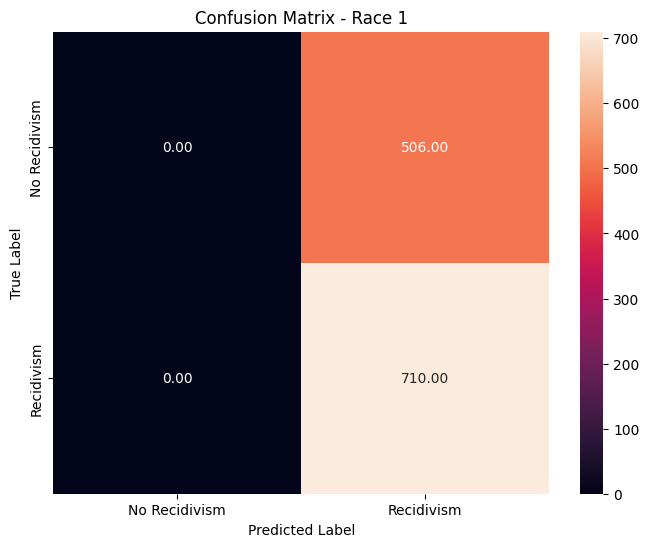

In [ ]:
from sklearn.metrics import confusion_matrix

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean, predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Race 1')
plt.show()

In [ ]:
predictions_clean = np.array(predictions_race_2, dtype = bool)

actual_clean = np.array(generalized_race_2["Recidivism_Within_3years"], dtype = bool)

In [ ]:
f1_score(predictions_clean, actual_clean)

0.7372793354101765

In [ ]:
adjusted_rand_score(actual_clean, predictions_clean)

0.0

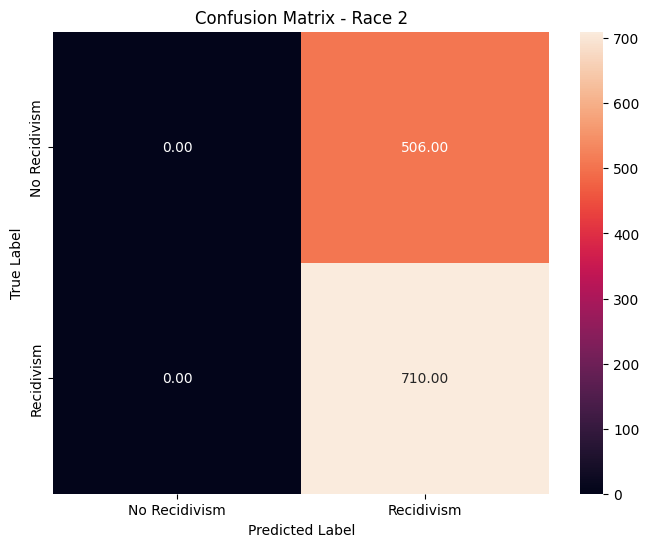

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean, predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Race 2')
plt.show()

## **KMeans**

In [ ]:
from sklearn.cluster import KMeans

k = 5

random_state = 42

predictions = {}

inertias = []

rows = []

elbow_method = []

k_fold = StratifiedKFold(n_splits = k, shuffle = True, random_state = random_state)

for number_of_clusters in range(1, 30):

  print("\n")

  print("Cluster " + str(number_of_clusters))

  min_inertia = 100000000000000

  for i, (train_index, test_index) in enumerate(k_fold.split(X_train, y_train)):

    training_set, test_set = X_train.iloc[train_index], X_train.iloc[test_index]
    training_labels, test_labels = y_train.iloc[train_index], y_train.iloc[test_index]

    k_means = KMeans(n_clusters = number_of_clusters, random_state = random_state)

    k_means.fit(training_set)

    prediction = k_means.predict(test_set)

    inertias.append(k_means.inertia_)

    if k_means.inertia_ < min_inertia:

      best_model = k_means

    print("Fold {}: Sum of Squared Errors: {:.4f}".format(i+1, k_means.inertia_))

  elbow_method.append(np.mean(inertias))

  row = {"Cluster": number_of_clusters, "Best Model": best_model}

  rows.append(row)

kmeans_df = pd.DataFrame(rows)



Cluster 1
Fold 1: Sum of Squared Errors: 201587.7255
Fold 2: Sum of Squared Errors: 200823.4412
Fold 3: Sum of Squared Errors: 200834.2145
Fold 4: Sum of Squared Errors: 199280.3385
Fold 5: Sum of Squared Errors: 199625.5002


Cluster 2
Fold 1: Sum of Squared Errors: 191022.3486
Fold 2: Sum of Squared Errors: 192001.3776
Fold 3: Sum of Squared Errors: 190110.8435
Fold 4: Sum of Squared Errors: 190077.3459
Fold 5: Sum of Squared Errors: 190383.0524


Cluster 3
Fold 1: Sum of Squared Errors: 184322.9416
Fold 2: Sum of Squared Errors: 184437.1767
Fold 3: Sum of Squared Errors: 184118.5858
Fold 4: Sum of Squared Errors: 182978.3855
Fold 5: Sum of Squared Errors: 183291.7457


Cluster 4
Fold 1: Sum of Squared Errors: 179436.4065
Fold 2: Sum of Squared Errors: 178192.2749
Fold 3: Sum of Squared Errors: 176944.2821
Fold 4: Sum of Squared Errors: 177185.3423
Fold 5: Sum of Squared Errors: 177333.9050


Cluster 5
Fold 1: Sum of Squared Errors: 174104.5917
Fold 2: Sum of Squared Errors: 174469

In [ ]:
kmeans_df = kmeans_df.set_index("Cluster")

kmeans_df

,Best Model
Cluster,
1,"KMeans(n_clusters=1, random_state=42)"
2,"KMeans(n_clusters=2, random_state=42)"
3,"KMeans(n_clusters=3, random_state=42)"
4,"KMeans(n_clusters=4, random_state=42)"
5,"KMeans(n_clusters=5, random_state=42)"
6,"KMeans(n_clusters=6, random_state=42)"
7,"KMeans(n_clusters=7, random_state=42)"
8,KMeans(random_state=42)
9,"KMeans(n_clusters=9, random_state=42)"


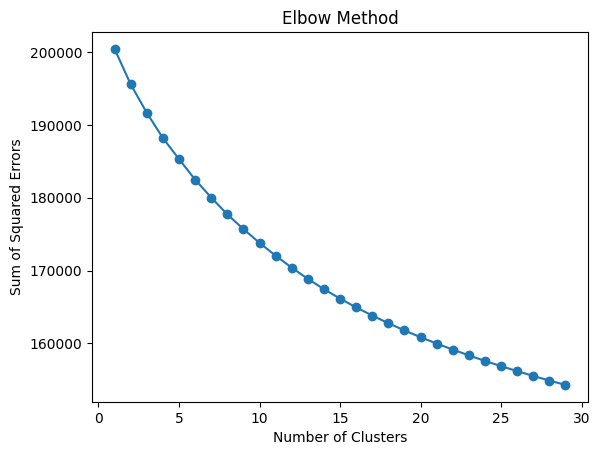

In [ ]:
plt.plot(range(1, 30), elbow_method, marker = 'o')

plt.title('Elbow Method')

plt.xlabel("Number of Clusters")

plt.ylabel("Sum of Squared Errors")

plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

In [ ]:
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, random_state=42)

In [ ]:
X_pca = pca.fit_transform(X_generalization)
X_tsne = tsne.fit_transform(X_generalization)

In [ ]:
best_model = KMeans(n_clusters = 2, random_state = 42)

number_of_clusters = 2

clusters = best_model.fit_predict(X_generalization)

In [ ]:
predictions_race_1 = best_model.predict(generalized_race_1.drop(["Race", "Recidivism_Within_3years"], axis = 1))

predictions_race_2 = best_model.predict(generalized_race_2.drop(["Race", "Recidivism_Within_3years"], axis = 1))

In [ ]:
predictions_clean = np.array(predictions_race_1, dtype = bool)

actual_clean = np.array(generalized_race_1["Recidivism_Within_3years"], dtype = bool)

In [ ]:
actual_clean

array([ True,  True, False, ..., False,  True,  True])

In [ ]:
silhouette_score(generalized_race_1.drop(["Race", "Recidivism_Within_3years"], axis = 1), predictions_clean)

0.06339212192823653

In [ ]:
from sklearn.metrics import adjusted_rand_score

adjusted_rand_score(actual_clean, predictions_clean)

0.0010136020410994873

In [ ]:
predictions_clean = np.array(predictions_race_2, dtype = bool)

actual_clean = np.array(generalized_race_2["Recidivism_Within_3years"], dtype = bool)

In [ ]:
silhouette_score(generalized_race_2.drop(["Race", "Recidivism_Within_3years"], axis = 1), predictions_clean)

0.06184475564816921

In [ ]:
adjusted_rand_score(actual_clean, predictions_clean)

0.027578747811147542

In [ ]:
best_model

KMeans(n_clusters=2, random_state=42)

PCA Explained Variance:
First component: 8.058%
Second component: 5.843%
Total (2 components): 13.901%

Cluster Statistics:

Cluster 0:
Size: 1737
Recidivism rate: 54.23%

Cluster 1:
Size: 1299
Recidivism rate: 67.28%


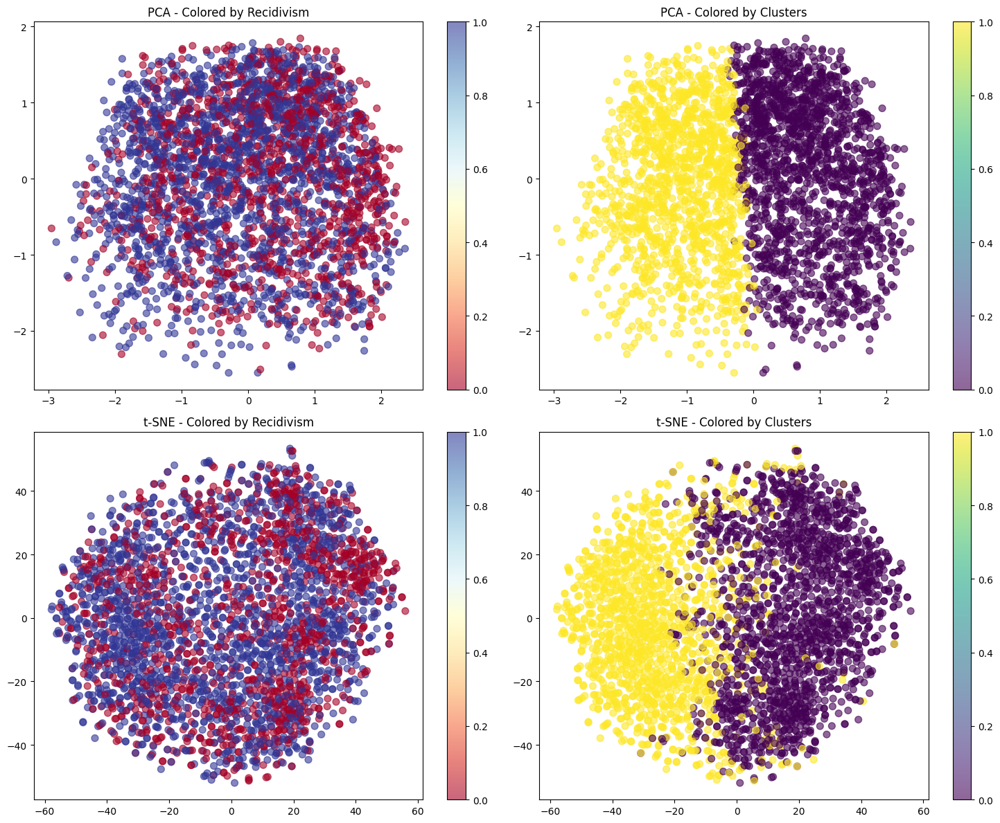

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

scatter_params = dict(alpha=0.6, s=50)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by Clusters')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=clusters, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by Clusters')
plt.colorbar(scatter4, ax=axes[1, 1])

plt.tight_layout()

print("PCA Explained Variance:")
print(f"First component: {pca.explained_variance_ratio_[0]:.3%}")
print(f"Second component: {pca.explained_variance_ratio_[1]:.3%}")
print(f"Total (2 components): {sum(pca.explained_variance_ratio_[:2]):.3%}")

print("\nCluster Statistics:")
for i in range(number_of_clusters):
    mask = clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_generalization[mask]):.2%}")

PCA Explained Variance:
First component: 8.058%
Second component: 5.843%
Total (2 components): 13.901%

Cluster Statistics:

Cluster 0:
Size: 1737
Recidivism rate: 54.23%

Cluster 1:
Size: 1299
Recidivism rate: 67.28%

PCA Cluster Statistics:

Cluster 0:
Size: 1687
Recidivism rate: 54.06%

Cluster 1:
Size: 1349
Recidivism rate: 67.01%

t-SNE Cluster Statistics:

Cluster 0:
Size: 1591
Recidivism rate: 54.81%

Cluster 1:
Size: 1445
Recidivism rate: 65.33%


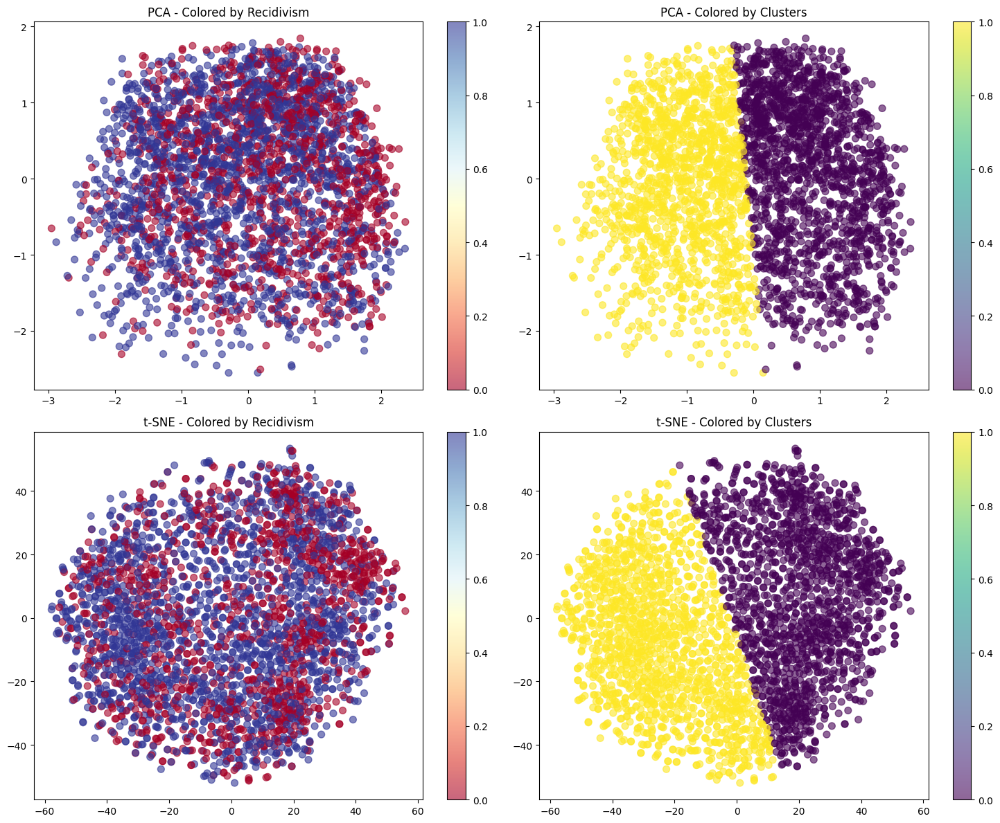

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

scatter_params = dict(alpha=0.6, s=50)

pca_clusters = best_model.fit_predict(X_pca)
tsne_clusters = best_model.fit_predict(X_tsne)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=pca_clusters, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by Clusters')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_generalization, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=tsne_clusters, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by Clusters')
plt.colorbar(scatter4, ax=axes[1, 1])

plt.tight_layout()

print("PCA Explained Variance:")
print(f"First component: {pca.explained_variance_ratio_[0]:.3%}")
print(f"Second component: {pca.explained_variance_ratio_[1]:.3%}")
print(f"Total (2 components): {sum(pca.explained_variance_ratio_[:2]):.3%}")

print("\nCluster Statistics:")
for i in range(number_of_clusters):
    mask = clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_generalization[mask]):.2%}")

print("\nPCA Cluster Statistics:")
for i in range(number_of_clusters):
    mask = pca_clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_generalization[mask]):.2%}")

print("\nt-SNE Cluster Statistics:")
for i in range(number_of_clusters):
    mask = tsne_clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_generalization[mask]):.2%}")

## **K Nearest Neighbors & KMeans as Classifer**

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_train)
X_tsne = tsne.fit_transform(X_train)
u_map = umap.UMAP(n_neighbors=50, min_dist=0.1, n_components=2, metric='euclidean')
X_umap = u_map.fit_transform(X_train)

In [ ]:
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(X_train)

pca_clusters = kmeans.fit_predict(X_pca)
tsne_clusters = kmeans.fit_predict(X_tsne)
umap_clusters = kmeans.fit_predict(X_umap)

PCA Explained Variance:
First component: 7.572%
Second component: 5.998%
Total (2 components): 13.570%

Cluster Statistics:

Cluster 0:
Size: 6412
Recidivism rate: 44.34%

Cluster 1:
Size: 5729
Recidivism rate: 75.79%


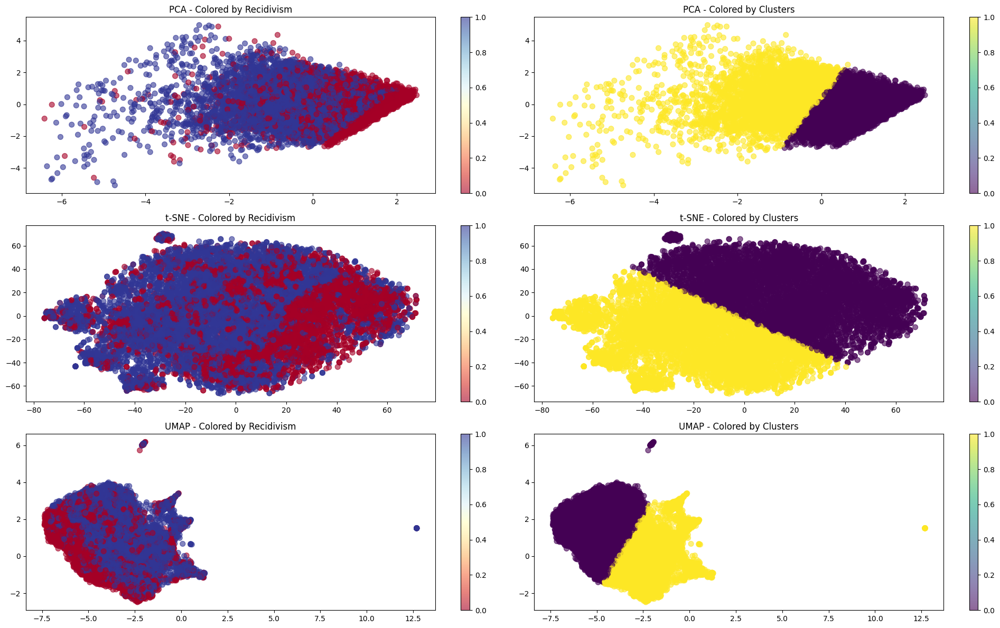

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(20, 12))

scatter_params = dict(alpha=0.6, s=50)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=pca_clusters, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by Clusters')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=tsne_clusters, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by Clusters')
plt.colorbar(scatter4, ax=axes[1, 1])

# UMAP plots
# By recidivism
scatter5 = axes[2, 0].scatter(X_umap[:, 0], X_umap[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[2, 0].set_title('UMAP - Colored by Recidivism')
plt.colorbar(scatter5, ax=axes[2, 0])

# By clusters
scatter6 = axes[2, 1].scatter(X_umap[:, 0], X_umap[:, 1],
                              c=umap_clusters, cmap='viridis',
                              **scatter_params)
axes[2, 1].set_title('UMAP - Colored by Clusters')
plt.colorbar(scatter6, ax=axes[2, 1])


plt.tight_layout()

print("PCA Explained Variance:")
print(f"First component: {pca.explained_variance_ratio_[0]:.3%}")
print(f"Second component: {pca.explained_variance_ratio_[1]:.3%}")
print(f"Total (2 components): {sum(pca.explained_variance_ratio_[:2]):.3%}")

print("\nCluster Statistics:")
for i in range(n_clusters):
    mask = clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_train[mask]):.2%}")

In [ ]:
number_of_clusters = 2
print("\nPCA Statistics:")
for i in range(number_of_clusters):
    mask = pca_clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_train[mask]):.2%}")

print("\nt-SNE Cluster Statistics:")
for i in range(number_of_clusters):
    mask = tsne_clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_train[mask]):.2%}")

print("\nUMAP Cluster Statistics:")
for i in range(number_of_clusters):
    mask = umap_clusters == i
    print(f"\nCluster {i}:")
    print(f"Size: {sum(mask)}")
    print(f"Recidivism rate: {np.mean(y_train[mask]):.2%}")


PCA Statistics:

Cluster 0:
Size: 6768
Recidivism rate: 42.79%

Cluster 1:
Size: 5373
Recidivism rate: 79.83%

t-SNE Cluster Statistics:

Cluster 0:
Size: 6426
Recidivism rate: 51.49%

Cluster 1:
Size: 5715
Recidivism rate: 67.82%

UMAP Cluster Statistics:

Cluster 0:
Size: 6494
Recidivism rate: 51.91%

Cluster 1:
Size: 5647
Recidivism rate: 67.54%


In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt

# Define hyperparameters for KNeighborsClassifier
hyperparameters = {
    'n_neighbors': range(2, 101)  # Testing n_neighbors from 2 to 100
}

k_outer = 3
k_inner = 5
random_state = 42

predictions = {}
accuracies = {"pca": [], "tsne": [], "umap": []}
precisions = {"pca": [], "tsne": [], "umap": []}
recalls = {"pca": [], "tsne": [], "umap": []}
models = {"pca": [], "tsne": [], "umap": []}
FPs = {"pca": [], "tsne": [], "umap": []}
FNs = {"pca": [], "tsne": [], "umap": []}
TPs = {"pca": [], "tsne": [], "umap": []}
TNs = {"pca": [], "tsne": [], "umap": []}
confusion_matrices = {"pca": [], "tsne": [], "umap": []}
f1_scores_per_k = {"pca": [], "tsne": [], "umap": []}

# Create outer and inner stratified K-Folds
k_fold_outer = StratifiedKFold(n_splits=k_outer, shuffle=True, random_state=random_state)
k_fold_inner = StratifiedKFold(n_splits=k_inner, shuffle=True, random_state=random_state)

# Iterate through the transformations
for transform_name, X_transformed in {"pca": X_pca, "tsne": X_tsne, "umap": X_umap}.items():
    outer_count = 0
    mean_f1_scores = {n: [] for n in hyperparameters['n_neighbors']}

    for outer_train_index, outer_test_index in k_fold_outer.split(X_transformed, y_train):
        # Split data for outer fold
        outer_training_set = X_transformed[outer_train_index]
        outer_test_set = X_transformed[outer_test_index]
        outer_training_labels = y_train.iloc[outer_train_index]
        outer_test_labels = y_train.iloc[outer_test_index]

        best_inner_accuracy = 0
        best_params = {}

        inner_count = 0

        for inner_train_index, inner_test_index in k_fold_inner.split(outer_training_set, outer_training_labels):
            # Split data for inner fold
            inner_training_set = outer_training_set[inner_train_index]
            inner_test_set = outer_training_set[inner_test_index]
            inner_training_labels = outer_training_labels.iloc[inner_train_index]
            inner_test_labels = outer_training_labels.iloc[inner_test_index]

            for n_neighbors in hyperparameters['n_neighbors']:
                knn = KNeighborsClassifier(n_neighbors=n_neighbors)
                knn.fit(inner_training_set, inner_training_labels)
                y_pred = knn.predict(inner_test_set)

                accuracy = f1_score(inner_test_labels, y_pred, average='weighted')

                inner_confusion_matrix = confusion_matrix(inner_test_labels, y_pred)

                FP = inner_confusion_matrix[0][1]
                FN = inner_confusion_matrix[1][0]
                TP = inner_confusion_matrix[1][1]
                TN = inner_confusion_matrix[0][0]

                predictions[f"{transform_name}_{outer_count}_{inner_count}"] = {
                    'outer_fold': outer_count,
                    'inner_fold': inner_count,
                    'n_neighbors': n_neighbors,
                    'accuracy': accuracy
                }

                mean_f1_scores[n_neighbors].append(accuracy)

                FPs[transform_name].append(FP)
                FNs[transform_name].append(FN)
                TPs[transform_name].append(TP)
                TNs[transform_name].append(TN)


                if accuracy > best_inner_accuracy:
                    best_inner_accuracy = accuracy
                    best_params = {'n_neighbors': n_neighbors}

            inner_count += 1

        best_model = KNeighborsClassifier(**best_params)
        best_model.fit(outer_training_set, outer_training_labels)
        models[transform_name].append(best_model)

        y_pred_outer = best_model.predict(outer_test_set)
        outer_test_accuracy = f1_score(outer_test_labels, y_pred_outer, average='weighted')
        outer_test_precision = precision_score(outer_test_labels, y_pred_outer)
        outer_test_recall = recall_score(outer_test_labels, y_pred_outer)
        accuracies[transform_name].append(outer_test_accuracy)
        precisions[transform_name].append(outer_test_precision)
        recalls[transform_name].append(outer_test_recall)

        #confusion_matrices[transform_name].append([[np.mean(TN), np.mean(FP)], [np.mean(FN), np.mean(TP)]])

        print(f"{transform_name.upper()} - Outer Fold {outer_count + 1}, "
              f"Best Params: {best_params}, Outer Test F1 Score: {outer_test_accuracy:.4f}")

        outer_count += 1

    confusion_matrices[transform_name].append([[np.mean(TNs[transform_name]), np.mean(FPs[transform_name])], [np.mean(FNs[transform_name]), np.mean(TPs[transform_name])]])



    # Compute mean F1 scores across all folds for each k
    f1_scores_per_k[transform_name] = [
        np.mean(mean_f1_scores[k]) for k in hyperparameters['n_neighbors']
    ]

for transform_name in ["pca", "tsne", "umap"]:

    print(f"\n{transform_name} Outer Loop F1 Scores: {accuracies[transform_name]}")
    print(f"\n{transform_name} Outer Loop Precision Scores: {precisions[transform_name]}")
    print(f"\n{transform_name} Outer Loop Recall Scores: {recalls[transform_name]}")

    print(f"\n{transform_name} Mean Outer Test F1 Score: {np.mean(accuracies[transform_name])}")
    print(f"\n{transform_name} Mean Outer Test Precision Score: {np.mean(precisions[transform_name])}")
    print(f"\n{transform_name} Mean Outer Test Recall Score: {np.mean(recalls[transform_name])}")



PCA - Outer Fold 1, Best Params: {'n_neighbors': 86}, Outer Test F1 Score: 0.6704
PCA - Outer Fold 2, Best Params: {'n_neighbors': 82}, Outer Test F1 Score: 0.6516
PCA - Outer Fold 3, Best Params: {'n_neighbors': 84}, Outer Test F1 Score: 0.6600
TSNE - Outer Fold 1, Best Params: {'n_neighbors': 53}, Outer Test F1 Score: 0.6594
TSNE - Outer Fold 2, Best Params: {'n_neighbors': 93}, Outer Test F1 Score: 0.6413
TSNE - Outer Fold 3, Best Params: {'n_neighbors': 32}, Outer Test F1 Score: 0.6595
UMAP - Outer Fold 1, Best Params: {'n_neighbors': 97}, Outer Test F1 Score: 0.6551
UMAP - Outer Fold 2, Best Params: {'n_neighbors': 97}, Outer Test F1 Score: 0.6483
UMAP - Outer Fold 3, Best Params: {'n_neighbors': 34}, Outer Test F1 Score: 0.6494

pca Outer Loop F1 Scores: [0.670388454252163, 0.6515975163817546, 0.6599760409587676]

pca Outer Loop Precision Scores: [0.6984069514844315, 0.6852994555353902, 0.691663633054241]

pca Outer Loop Recall Scores: [0.8054279749478079, 0.7883089770354906, 0.7

In [ ]:
confusion_matrices["pca"]

[[[322.3326599326599, 338.46734006734005],
  [210.56700336700337, 747.4329966329966]]]

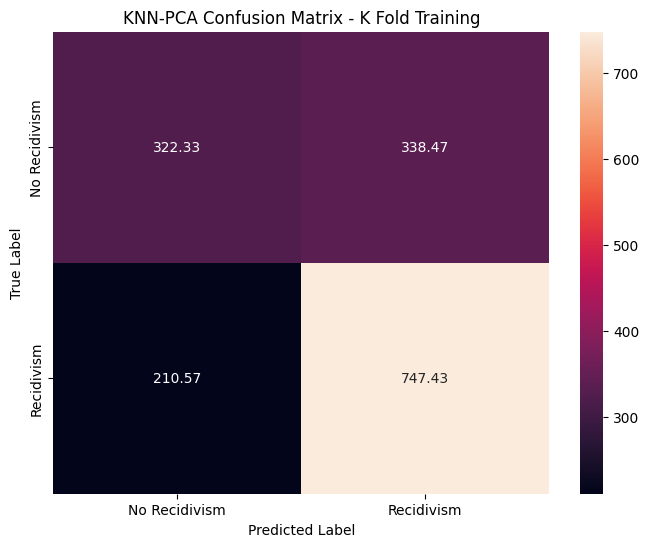

In [ ]:
plt.figure(figsize = (8, 6))

sns.heatmap(confusion_matrices["pca"][0],
            annot = True,
            fmt = ".2f",
            xticklabels = ["No Recidivism", "Recidivism"],
            yticklabels = ["No Recidivism", "Recidivism"]
            )

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.title("KNN-PCA Confusion Matrix - K Fold Training")
plt.show()

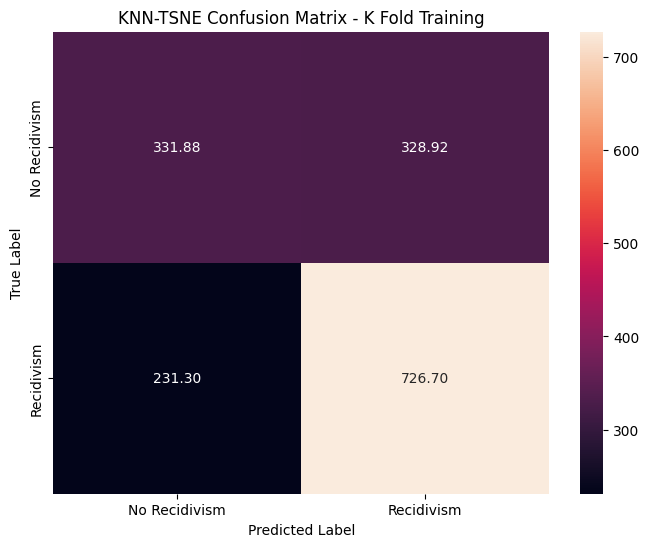

In [ ]:
plt.figure(figsize = (8, 6))

sns.heatmap(confusion_matrices["tsne"][0],
            annot = True,
            fmt = ".2f",
            xticklabels = ["No Recidivism", "Recidivism"],
            yticklabels = ["No Recidivism", "Recidivism"])

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.title("KNN-TSNE Confusion Matrix - K Fold Training")
plt.show()

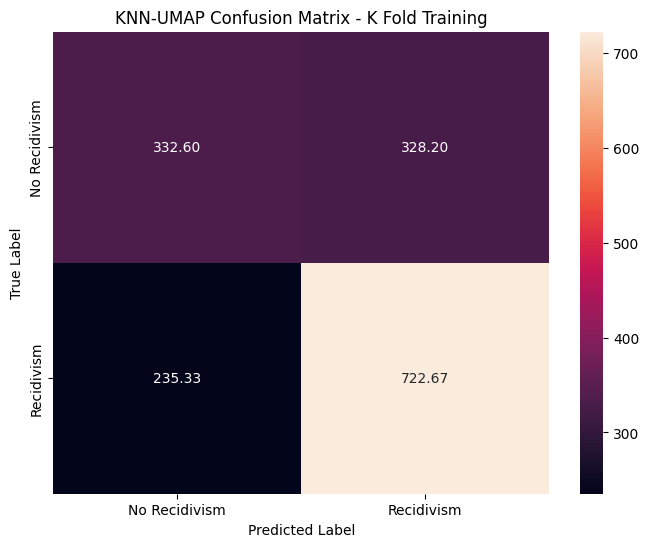

In [ ]:
plt.figure(figsize = (8, 6))

sns.heatmap(confusion_matrices["umap"][0],
            annot = True,
            fmt = ".2f",
            xticklabels = ["No Recidivism", "Recidivism"],
            yticklabels = ["No Recidivism", "Recidivism"])

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.title("KNN-UMAP Confusion Matrix - K Fold Training")
plt.show()



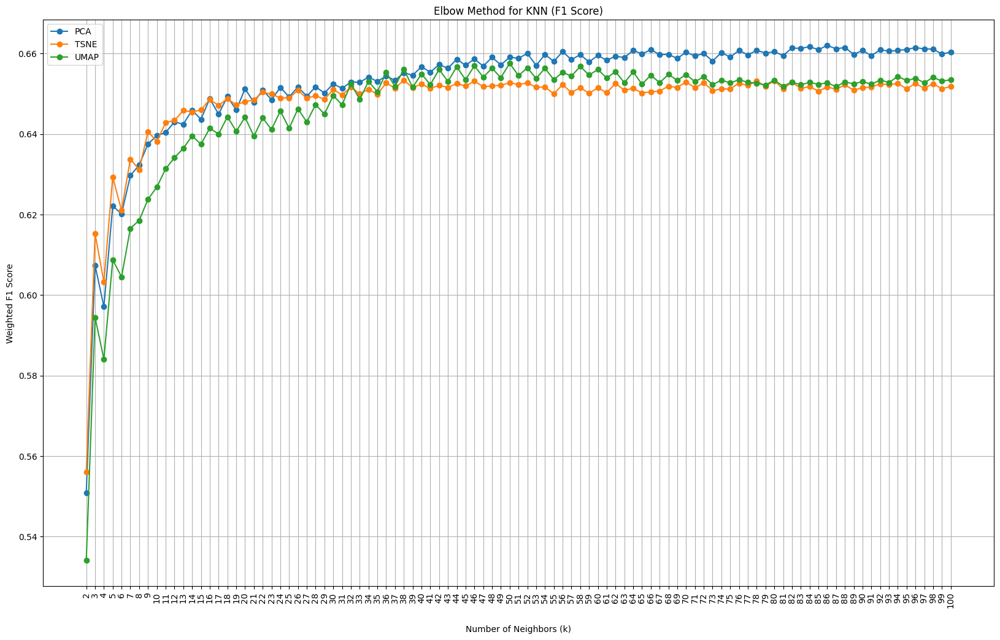


PCA Outer Loop F1 Scores: [0.670388454252163, 0.6515975163817546, 0.6599760409587676]
PCA Mean Outer Test F1 Score: 0.6607

TSNE Outer Loop F1 Scores: [0.6593578123372329, 0.6413396191801194, 0.6594758632028135]
TSNE Mean Outer Test F1 Score: 0.6534

UMAP Outer Loop F1 Scores: [0.6500242942755592, 0.6468633442774316, 0.6491429960227592]
UMAP Mean Outer Test F1 Score: 0.6487


In [ ]:
# Plot elbow curves
plt.figure(figsize=(20, 12))
for transform_name in ["pca", "tsne", "umap"]:
    plt.plot(
        hyperparameters['n_neighbors'],
        f1_scores_per_k[transform_name],
        marker='o',
        label=transform_name.upper()
    )

plt.title('Elbow Method for KNN (F1 Score)')
plt.xlabel('Number of Neighbors (k)', labelpad=20)
plt.ylabel('Weighted F1 Score')
plt.xticks(hyperparameters['n_neighbors'], rotation=90)
plt.grid()
plt.legend()
plt.show()

# Output results
for transform_name in ["pca", "tsne", "umap"]:
    print(f"\n{transform_name.upper()} Outer Loop F1 Scores: {accuracies[transform_name]}")
    print(f"{transform_name.upper()} Mean Outer Test F1 Score: {np.mean(accuracies[transform_name]):.4f}")


In [ ]:
best_neighbors = 13
knearest = KNeighborsClassifier(n_neighbors=best_neighbors)


generalized_race_1_dropped = generalized_race_1.drop(["Race", "Recidivism_Within_3years"], axis = 1)
generalized_race_2_dropped = generalized_race_2.drop(["Race", "Recidivism_Within_3years"], axis = 1)

# Fit and predict for PCA/TSNE/UMAP-transformed data
knearest.fit(X_pca, y_train)
pca_race_1 = pca.transform(generalized_race_1_dropped)
pca_race_2 = pca.transform(generalized_race_2_dropped)
pca_predictions_race_1 = knearest.predict(pca_race_1)
pca_predictions_race_2 = knearest.predict(pca_race_2)

knearest.fit(X_tsne, y_train)
tsne_race_1 = tsne.fit_transform(generalized_race_1_dropped)
tsne_race_2 = tsne.fit_transform(generalized_race_2_dropped)
tsne_predictions_race_1 = knearest.predict(tsne_race_1)
tsne_predictions_race_2 = knearest.predict(tsne_race_2)

knearest.fit(X_umap, y_train)
umap_race_1 = u_map.fit_transform(generalized_race_1_dropped)
umap_race_2 = u_map.fit_transform(generalized_race_2_dropped)
umap_predictions_race_1 = knearest.predict(umap_race_1)
umap_predictions_race_2 = knearest.predict(umap_race_2)

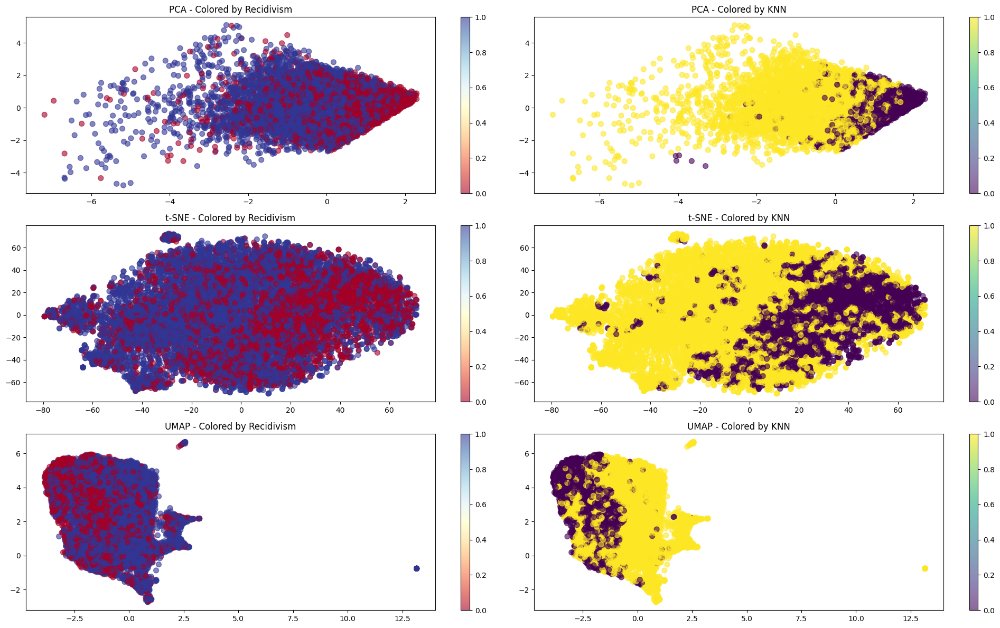

In [ ]:
# Train Data

fig, axes = plt.subplots(3, 2, figsize=(20, 12))

scatter_params = dict(alpha=0.6, s=50)

X_pca_knn = knearest.fit(X_pca, y_train).predict(X_pca)
X_tsne_knn = knearest.fit(X_tsne, y_train).predict(X_tsne)
X_umap_knn = knearest.fit(X_umap, y_train).predict(X_umap)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1],
                              c=X_pca_knn, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by KNN')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(X_tsne[:, 0], X_tsne[:, 1],
                              c=X_tsne_knn, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by KNN')
plt.colorbar(scatter4, ax=axes[1, 1])

# UMAP plots
# By recidivism
scatter5 = axes[2, 0].scatter(X_umap[:, 0], X_umap[:, 1],
                              c=y_train, cmap='RdYlBu',
                              **scatter_params)
axes[2, 0].set_title('UMAP - Colored by Recidivism')
plt.colorbar(scatter5, ax=axes[2, 0])

# By clusters
scatter6 = axes[2, 1].scatter(X_umap[:, 0], X_umap[:, 1],
                              c=X_umap_knn, cmap='viridis',
                              **scatter_params)
axes[2, 1].set_title('UMAP - Colored by KNN')
plt.colorbar(scatter6, ax=axes[2, 1])


plt.tight_layout()

KNN Model Results Race 1
PCA- F1 Score: 0.7347
PCA- Precision: 0.6696
PCA- Recall: 0.8137
t-SNE- F1 Score: 0.6664
t-SNE- Precision: 0.6273
t-SNE- Recall: 0.7107
UMAP- F1 Score: 0.7560
UMAP- Precision: 0.6077
UMAP- Recall: 1.0000


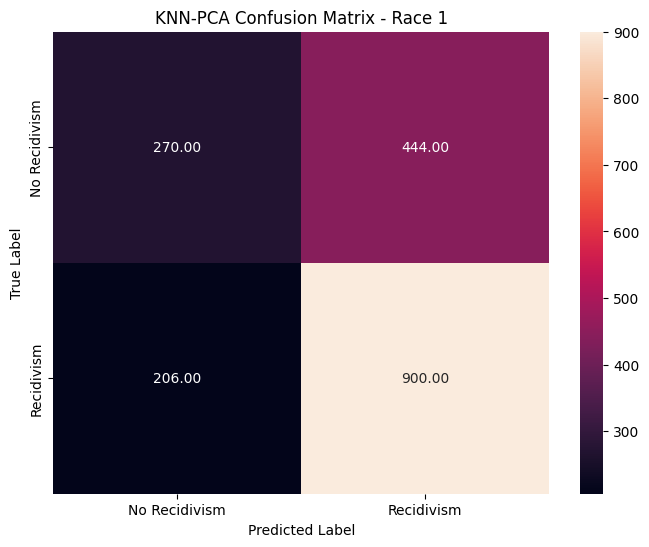

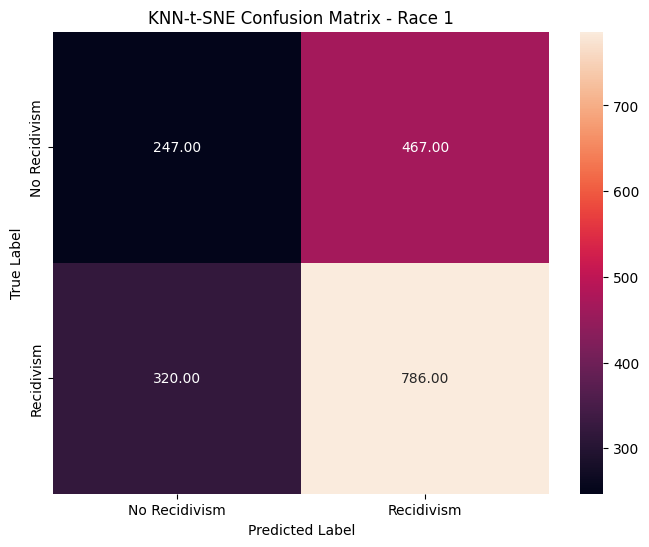

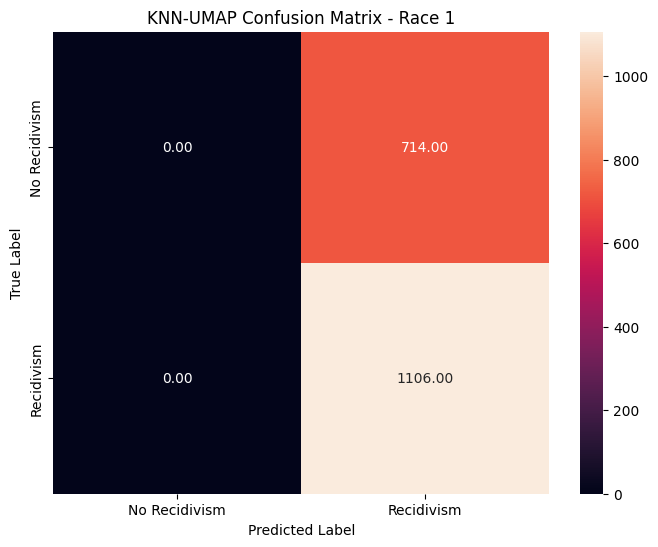

In [ ]:
from sklearn.metrics import precision_score, recall_score, confusion_matrix

pca_predictions_clean = np.array(pca_predictions_race_1, dtype = bool)
tsne_predictions_clean = np.array(tsne_predictions_race_1, dtype = bool)
umap_predictions_clean = np.array(umap_predictions_race_1, dtype = bool)

actual_clean_r1 = np.array(generalized_race_1["Recidivism_Within_3years"], dtype = bool)
print("KNN Model Results Race 1")
print(f"PCA- F1 Score: {f1_score(actual_clean_r1, pca_predictions_clean):.4f}")
print(f"PCA- Precision: {precision_score(actual_clean_r1, pca_predictions_clean):.4f}")
print(f"PCA- Recall: {recall_score(actual_clean_r1, pca_predictions_clean):.4f}")

print(f"t-SNE- F1 Score: {f1_score(actual_clean_r1, tsne_predictions_clean):.4f}")
print(f"t-SNE- Precision: {precision_score(actual_clean_r1, tsne_predictions_clean):.4f}")
print(f"t-SNE- Recall: {recall_score(actual_clean_r1, tsne_predictions_clean):.4f}")

print(f"UMAP- F1 Score: {f1_score(actual_clean_r1, umap_predictions_clean):.4f}")
print(f"UMAP- Precision: {precision_score(actual_clean_r1, umap_predictions_clean):.4f}")
print(f"UMAP- Recall: {recall_score(actual_clean_r1, umap_predictions_clean):.4f}")


plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r1, pca_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('KNN-PCA Confusion Matrix - Race 1')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r1, tsne_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('KNN-t-SNE Confusion Matrix - Race 1')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r1, umap_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('KNN-UMAP Confusion Matrix - Race 1')
plt.show()

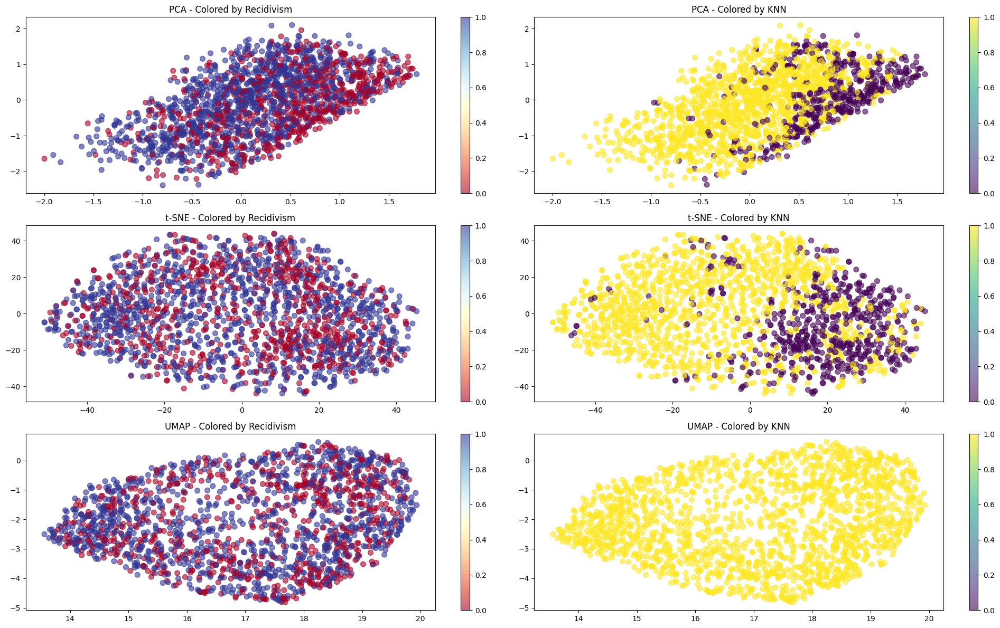

In [ ]:
# Test Data

fig, axes = plt.subplots(3, 2, figsize=(20, 12))

scatter_params = dict(alpha=0.6, s=50)

X_pca_knn = knearest.fit(X_pca, y_train).predict(pca_race_1)
X_tsne_knn = knearest.fit(X_tsne, y_train).predict(tsne_race_1)
X_umap_knn = knearest.fit(X_umap, y_train).predict(umap_race_1)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(pca_race_1[:, 0], pca_race_1[:, 1],
                              c=actual_clean_r1, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(pca_race_1[:, 0], pca_race_1[:, 1],
                              c=X_pca_knn, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by KNN')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(tsne_race_1[:, 0], tsne_race_1[:, 1],
                              c=actual_clean_r1, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(tsne_race_1[:, 0], tsne_race_1[:, 1],
                              c=X_tsne_knn, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by KNN')
plt.colorbar(scatter4, ax=axes[1, 1])

# UMAP plots
# By recidivism
scatter5 = axes[2, 0].scatter(umap_race_1[:, 0], umap_race_1[:, 1],
                              c=actual_clean_r1, cmap='RdYlBu',
                              **scatter_params)
axes[2, 0].set_title('UMAP - Colored by Recidivism')
plt.colorbar(scatter5, ax=axes[2, 0])

# By clusters
scatter6 = axes[2, 1].scatter(umap_race_1[:, 0], umap_race_1[:, 1],
                              c=X_umap_knn, cmap='viridis',
                              vmin=0, vmax=1,
                              **scatter_params)
axes[2, 1].set_title('UMAP - Colored by KNN')
plt.colorbar(scatter6, ax=axes[2, 1])


plt.tight_layout()

KNN Model Results Race 2
PCA- F1 Score: 0.7325
PCA- Precision: 0.6726
PCA- Recall: 0.8042
t-SNE- F1 Score: 0.6421
t-SNE- Precision: 0.5843
t-SNE- Recall: 0.7127
UMAP- F1 Score: 0.7373
UMAP- Precision: 0.5839
UMAP- Recall: 1.0000


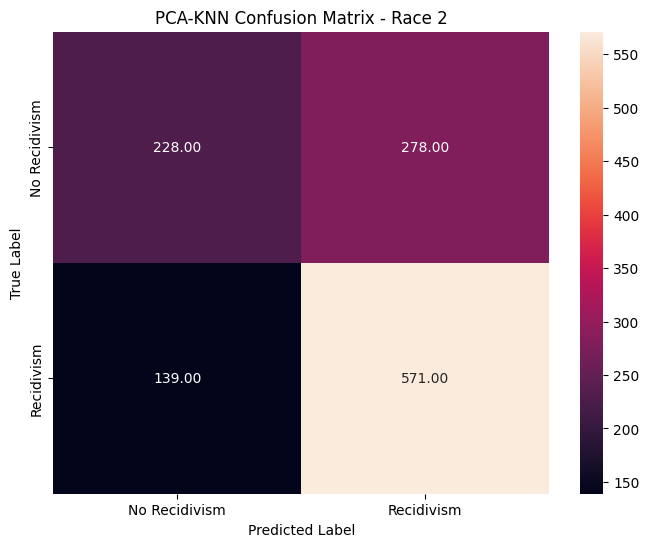

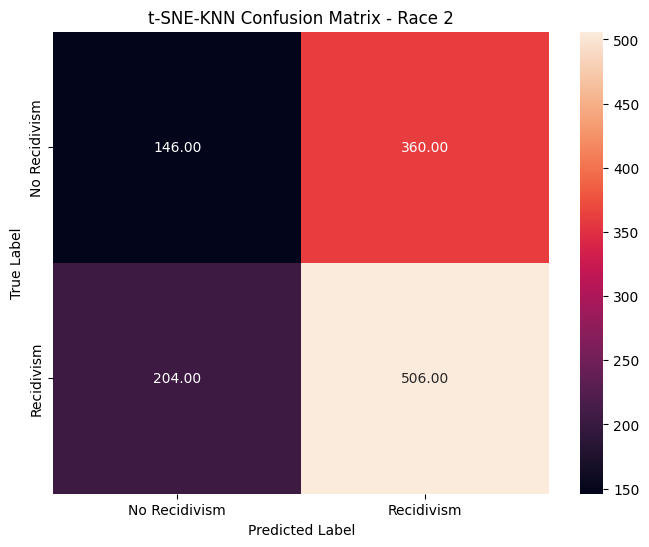

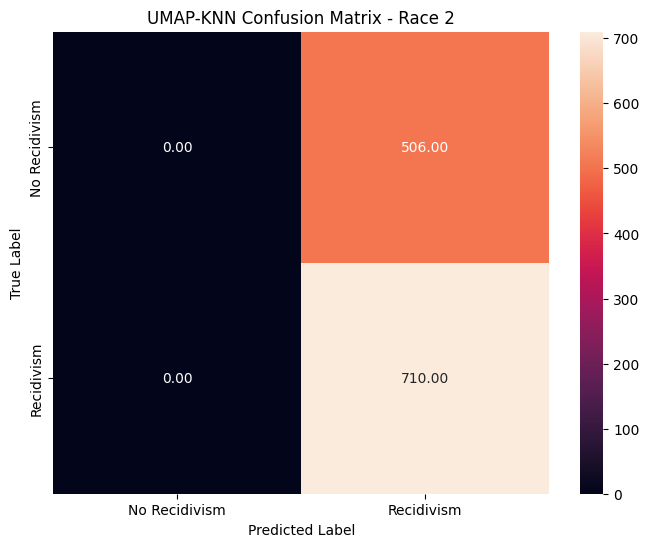

In [ ]:
pca_predictions_clean = np.array(pca_predictions_race_2, dtype = bool)
tsne_predictions_clean = np.array(tsne_predictions_race_2, dtype = bool)
umap_predictions_clean = np.array(umap_predictions_race_2, dtype = bool)

actual_clean_r2 = np.array(generalized_race_2["Recidivism_Within_3years"], dtype = bool)

print("KNN Model Results Race 2")
print(f"PCA- F1 Score: {f1_score(actual_clean_r2, pca_predictions_clean):.4f}")
print(f"PCA- Precision: {precision_score(actual_clean_r2, pca_predictions_clean):.4f}")
print(f"PCA- Recall: {recall_score(actual_clean_r2, pca_predictions_clean):.4f}")
print(f"t-SNE- F1 Score: {f1_score(actual_clean_r2, tsne_predictions_clean):.4f}")
print(f"t-SNE- Precision: {precision_score(actual_clean_r2, tsne_predictions_clean):.4f}")
print(f"t-SNE- Recall: {recall_score(actual_clean_r2, tsne_predictions_clean):.4f}")
print(f"UMAP- F1 Score: {f1_score(actual_clean_r2, umap_predictions_clean):.4f}")
print(f"UMAP- Precision: {precision_score(actual_clean_r2, umap_predictions_clean):.4f}")
print(f"UMAP- Recall: {recall_score(actual_clean_r2, umap_predictions_clean):.4f}")


plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r2, pca_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('PCA-KNN Confusion Matrix - Race 2')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r2, tsne_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('t-SNE-KNN Confusion Matrix - Race 2')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(actual_clean_r2, umap_predictions_clean),
            annot=True,
            fmt='.2f',
            xticklabels=['No Recidivism', 'Recidivism'],  # Predicted labels (columns)
            yticklabels=['No Recidivism', 'Recidivism'])  # True labels (rows)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('UMAP-KNN Confusion Matrix - Race 2')
plt.show()

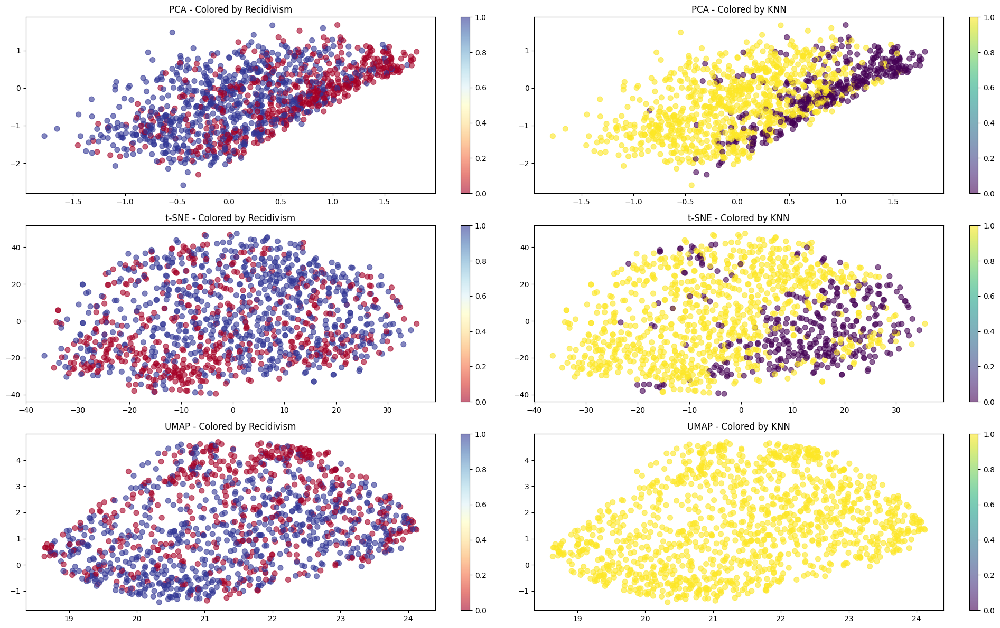

In [ ]:
# Test Data

fig, axes = plt.subplots(3, 2, figsize=(20, 12))

scatter_params = dict(alpha=0.6, s=50)

X_pca_knn = knearest.fit(X_pca, y_train).predict(pca_race_2)
X_tsne_knn = knearest.fit(X_tsne, y_train).predict(tsne_race_2)
X_umap_knn = knearest.fit(X_umap, y_train).predict(umap_race_2)

# PCA plots
# By recidivism
scatter1 = axes[0, 0].scatter(pca_race_2[:, 0], pca_race_2[:, 1],
                              c=actual_clean_r2, cmap='RdYlBu',
                              **scatter_params)
axes[0, 0].set_title('PCA - Colored by Recidivism')
plt.colorbar(scatter1, ax=axes[0, 0])

# By clusters
scatter2 = axes[0, 1].scatter(pca_race_2[:, 0], pca_race_2[:, 1],
                              c=X_pca_knn, cmap='viridis',
                              **scatter_params)
axes[0, 1].set_title('PCA - Colored by KNN')
plt.colorbar(scatter2, ax=axes[0, 1])

# t-SNE plots
# By recidivism
scatter3 = axes[1, 0].scatter(tsne_race_2[:, 0], tsne_race_2[:, 1],
                              c=actual_clean_r2, cmap='RdYlBu',
                              **scatter_params)
axes[1, 0].set_title('t-SNE - Colored by Recidivism')
plt.colorbar(scatter3, ax=axes[1, 0])

# By clusters
scatter4 = axes[1, 1].scatter(tsne_race_2[:, 0], tsne_race_2[:, 1],
                              c=X_tsne_knn, cmap='viridis',
                              **scatter_params)
axes[1, 1].set_title('t-SNE - Colored by KNN')
plt.colorbar(scatter4, ax=axes[1, 1])

# UMAP plots
# By recidivism
scatter5 = axes[2, 0].scatter(umap_race_2[:, 0], umap_race_2[:, 1],
                              c=actual_clean_r2, cmap='RdYlBu',
                              **scatter_params)
axes[2, 0].set_title('UMAP - Colored by Recidivism')
plt.colorbar(scatter5, ax=axes[2, 0])

# By clusters
scatter6 = axes[2, 1].scatter(umap_race_2[:, 0], umap_race_2[:, 1],
                              c=X_umap_knn, cmap='viridis',
                              vmin=0, vmax=1,
                              **scatter_params)
axes[2, 1].set_title('UMAP - Colored by KNN')
plt.colorbar(scatter6, ax=axes[2, 1])


plt.tight_layout()

Metric Differences by Model and Transformation: {'F1 Score': {'PCA': 0.0021730308544201105, 't-SNE': 0.024252081347383325, 'UMAP': 0.018701525833842547}, 'Precision': {'PCA': -0.002913091031465642, 't-SNE': 0.042998881207043094, 'UMAP': 0.02381072874493917}, 'Recall': {'PCA': 0.00951786669383381, 't-SNE': -0.002006978580342822, 'UMAP': 0.0}}


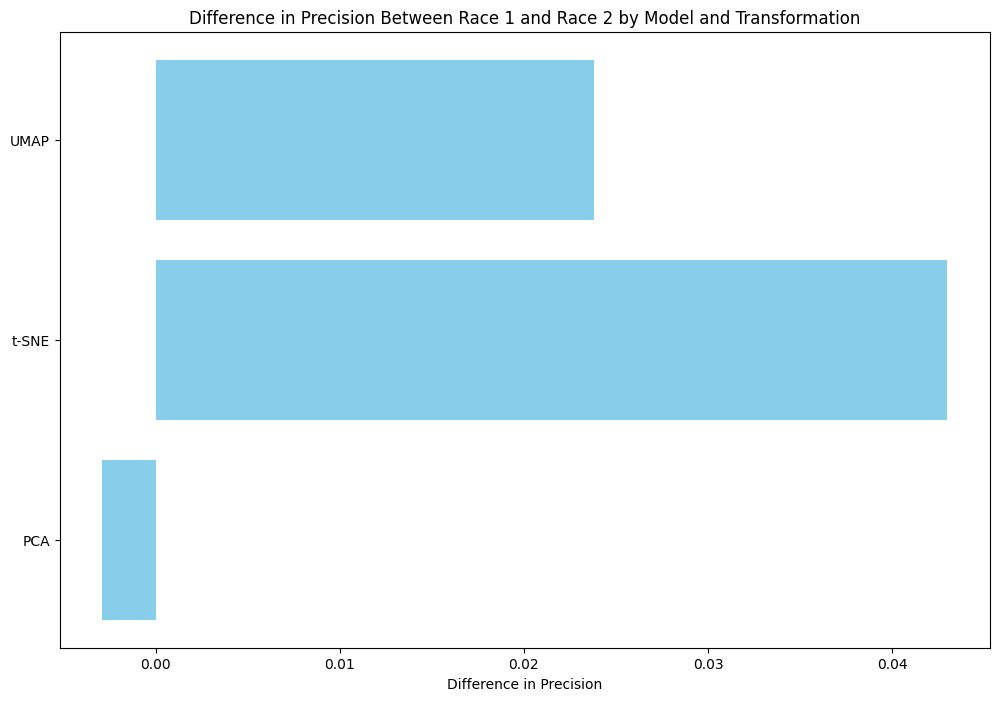

In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score

metric_differences = {
    "F1 Score": {
        "PCA": f1_score(actual_clean_r1, pca_predictions_race_1) -
               f1_score(actual_clean_r2, pca_predictions_race_2),
        "t-SNE": f1_score(actual_clean_r1, tsne_predictions_race_1) -
                 f1_score(actual_clean_r2, tsne_predictions_race_2),
        "UMAP": f1_score(actual_clean_r1, umap_predictions_race_1) -
                f1_score(actual_clean_r2, umap_predictions_race_2),
    },
    "Precision": {
        "PCA": precision_score(actual_clean_r1, pca_predictions_race_1) -
               precision_score(actual_clean_r2, pca_predictions_race_2),
        "t-SNE": precision_score(actual_clean_r1, tsne_predictions_race_1) -
                 precision_score(actual_clean_r2, tsne_predictions_race_2),
        "UMAP": precision_score(actual_clean_r1, umap_predictions_race_1) -
                precision_score(actual_clean_r2, umap_predictions_race_2),
    },
    "Recall": {
        "PCA": recall_score(actual_clean_r1, pca_predictions_race_1) -
               recall_score(actual_clean_r2, pca_predictions_race_2),
        "t-SNE": recall_score(actual_clean_r1, tsne_predictions_race_1) -
                 recall_score(actual_clean_r2, tsne_predictions_race_2),
        "UMAP": recall_score(actual_clean_r1, umap_predictions_race_1) -
                recall_score(actual_clean_r2, umap_predictions_race_2),
    },
}
print("Metric Differences by Model and Transformation:", metric_differences)

# plot of the differences in the metrics
plt.figure(figsize=(12, 8))
plt.barh(list(metric_differences["Precision"].keys()), list(metric_differences["Precision"].values()), color='skyblue')
plt.xlabel('Difference in Precision')
plt.title('Difference in Precision Between Race 1 and Race 2 by Model and Transformation')
plt.show()


In [ ]:
from scipy.stats import ttest_ind
import numpy as np

f1_scores_race_1 = [
    f1_score(actual_clean_r1, pca_predictions_race_1),
    f1_score(actual_clean_r1, tsne_predictions_race_1),
    f1_score(actual_clean_r1, umap_predictions_race_1)
]
f1_scores_race_2 = [
    f1_score(actual_clean_r2, pca_predictions_race_2),
    f1_score(actual_clean_r2, tsne_predictions_race_2),
    f1_score(actual_clean_r2, umap_predictions_race_2)
]


t_stat, p_value = ttest_ind(f1_scores_race_1, f1_scores_race_2)

print(f"T-Statistic: {t_stat:.4f}, P-Value: {p_value:.4f}")
if p_value < 0.05:
    print("The difference in F1 scores is statistically significant.")
else:
    print("The difference in F1 scores is not statistically significant.")


T-Statistic: 0.3661, P-Value: 0.7329
The difference in F1 scores is not statistically significant.


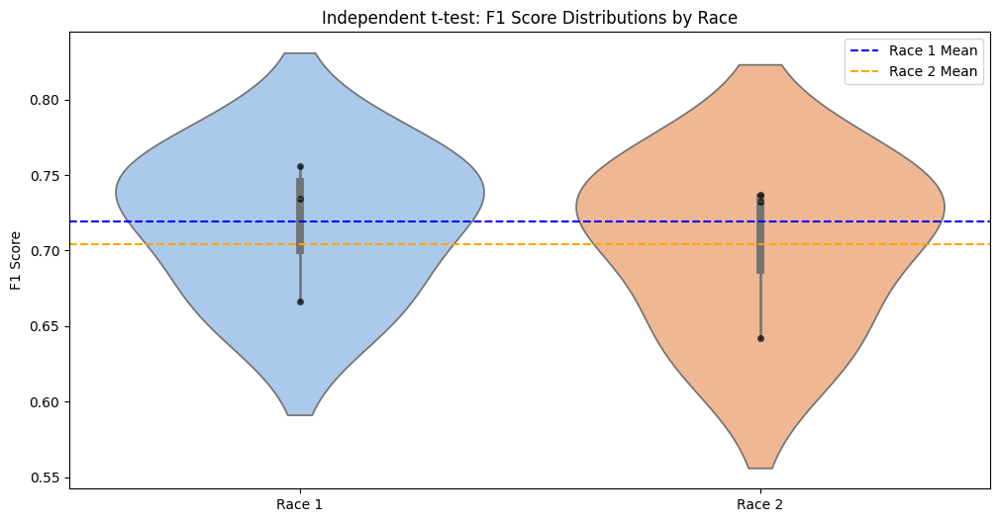

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.violinplot(data=[f1_scores_race_1, f1_scores_race_2], palette="pastel")
sns.swarmplot(data=[f1_scores_race_1, f1_scores_race_2], color="k", alpha=0.7)
plt.xticks([0, 1], ["Race 1", "Race 2"])
plt.axhline(y=np.mean(f1_scores_race_1), color='blue', linestyle='--', label='Race 1 Mean')
plt.axhline(y=np.mean(f1_scores_race_2), color='orange', linestyle='--', label='Race 2 Mean')
plt.title("Independent t-test: F1 Score Distributions by Race")
plt.ylabel("F1 Score")
plt.legend()
plt.show()